<B>PREPARE DATA TO FOLDER<B>

In [ ]:
#import os
#os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/ART DATASET"
#%cd /content/gdrive/My Drive/ART DATASET
#!kaggle datasets download -d thedownhill/art-images-drawings-painting-sculpture-engraving
#!unzip art-images-drawings-painting-sculpture-engraving.zip

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/BEST ARTWORKS OF ALL TIME"
%cd /content/gdrive/My Drive/BEST ARTWORKS OF ALL TIME

/content/gdrive/My Drive/BEST ARTWORKS OF ALL TIME


In [ ]:
#!kaggle datasets download -d ikarus777/best-artworks-of-all-time
!unzip best-artworks-of-all-time.zip

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


<B> IMPORTS <B>

In [ ]:
import cv2
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from keras.models import load_model
from statistics import mean

from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Conv2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Reshape
from keras.layers import UpSampling2D
from keras.layers import BatchNormalization

from numpy.random import randn
from numpy.random import randint

<B> CONSTANTS <B>

In [ ]:
images_path = '/content/gdrive/My Drive/ART DATASET/dataset/dataset_updated'
extensions = ['*.jpg','*.png','*.jpeg']

IMAGE_SIZE = 128
CHANNEL_DIMENSION = 3
GENERATE_RES = 3
NOISE_SIZE = 128

<B> LOADING IMAGES <B>

In [ ]:
images = []

PRE PROCESS IMAGES AND SAVE TO NPY

In [ ]:
for filetype in extensions:
    for path in list(map(str,Path(images_path).rglob(filetype))):
        try:
            img = cv2.imread(path)
            resized = cv2.resize(img,(IMAGE_SIZE,IMAGE_SIZE))
            images.append(resized)
            except: pass
num = np.array(images)
dataset = np.reshape(num,(-1,IMAGE_SIZE,IMAGE_SIZE,CHANNEL_DIMENSION))
dataset = (dataset - 127.5)/127.5
print(dataset.shape)



LOAD NUMPY ARRAY

In [ ]:
dataset = np.load('/content/gdrive/My Drive/ART DATASET/art_data.npy')

<B> DISCRMINATOR <B>

In [ ]:
def define_discriminator(input_shape=(IMAGE_SIZE,IMAGE_SIZE,CHANNEL_DIMENSION)):
    model = Sequential()
    model.add(Conv2D(256,(3,3),strides=(2,2),padding='same',input_shape = input_shape))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(256,(3,3),strides=(2,2),padding = 'same', input_shape = input_shape))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Flatten())
    model.add(Dropout(rate=0.4))
    model.add(Dense(1,activation=sigmoid))

    opt = Adam(lr=0.0002, beta_1 = 0.5)
    model.compile(loss='binary_crossentropy',optimizer=opt,metrics=['accuracy'])

dis = define_discriminator()
dis.summary()

NameError: ignored

<B> GENERATOR <B>

In [ ]:
def define_generator(noise_size=NOISE_SIZE,channels=CHANNEL_DIMENSION):
    model = Sequential()
    model.add(Dense(4*4*256,activation='relu',input_dim=noise_size))
    model.add(Reshape((4,4,256)))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation('relu'))

    model.add(UpSampling2D())
    model.add(Conv2D(256,kernel_size=3,padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation('relu'))

    for i in range(GENERATE_RES):
        model.add(UpSampling2D())
        model.add(Conv2D(256, kernel_size=3, padding='same'))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Activation('relu'))

    model.add(Conv2D(channels,kernel_size=3,padding='same'))
    model.add(Activation('tanh'))
    return model

gen = define_generator()
gen.summary()

Model: "sequential_63"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_45 (Dense)             (None, 4096)              528384    
_________________________________________________________________
reshape_24 (Reshape)         (None, 4, 4, 256)         0         
_________________________________________________________________
up_sampling2d_120 (UpSamplin (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_186 (Conv2D)          (None, 8, 8, 256)         590080    
_________________________________________________________________
batch_normalization_124 (Bat (None, 8, 8, 256)         1024      
_________________________________________________________________
activation_144 (Activation)  (None, 8, 8, 256)         0         
_________________________________________________________________
up_sampling2d_121 (UpSamplin (None, 16, 16, 256)     

<B> GAN <B>

In [ ]:
def define_gan(discriminator,generator):
      discriminator.trainable = False
      model = Sequential()
      model.add(generator)
      model.add(discriminator)
      opt = Adam(lr=0.0004, beta_1=0.5)
      model.compile(loss='binary_crossentropy',optimizer=opt)
      return model  

<B> HELPER FUNCTIONS <B>

In [ ]:
def generate_real_samples(dataset,n_samples):
      ix = randint(0,dataset.shape[0],n_samples)
      X = dataset[ix]
      y = np.ones((n_samples,1))
      return X,y
    
def generate_latent_points(n_samples,noise_size=NOISE_SIZE):
      X = randn(noise_size * n_samples)
      X = X.reshape((n_samples,noise_size))
      return X

def generate_fake_samples(generator,noise_size,n_samples):
      x_input = generate_latent_points(n_samples=n_samples)
      X = generator.predict(x_input)
      y = np.zeros((n_samples,1))
      return X,y

def show_plot(examples,n):
    for i in range(n*n):
          plt.subplot(n,n,1+i)
          plt.axis('off')
          plt.imshow(examples[i,:,:,2])
    plt.show()


<B> CONSTRUCTION AND TRAINING <B>

EPOCH: 1 BATCH: 1 d_loss1: 0.7383275032043457 d_loss2: 0.7275016903877258 g_loss: 0.2502126395702362
EPOCH: 1 BATCH: 2 d_loss1: 0.21703296899795532 d_loss2: 0.8720420598983765 g_loss: 0.09231241047382355
EPOCH: 1 BATCH: 3 d_loss1: 0.0882323682308197 d_loss2: 0.9790291786193848 g_loss: 0.03805322200059891
EPOCH: 1 BATCH: 4 d_loss1: 0.07849892973899841 d_loss2: 0.5962287187576294 g_loss: 0.03340558335185051
EPOCH: 1 BATCH: 5 d_loss1: 0.26209598779678345 d_loss2: 0.14180326461791992 g_loss: 0.00016012426931411028
EPOCH: 1 BATCH: 6 d_loss1: 0.21911229193210602 d_loss2: 0.012074611149728298 g_loss: 6.194426305228262e-07
EPOCH: 1 BATCH: 7 d_loss1: 0.29742178320884705 d_loss2: 0.04492214694619179 g_loss: 1.0681972639758897e-08
EPOCH: 1 BATCH: 8 d_loss1: 0.19005537033081055 d_loss2: 0.08957808464765549 g_loss: 3.983143259667088e-10
EPOCH: 1 BATCH: 9 d_loss1: 0.08245186507701874 d_loss2: 0.01246644090861082 g_loss: 2.0832485736477224e-10
EPOCH: 1 BATCH: 10 d_loss1: 0.22097861766815186 d_loss2: 

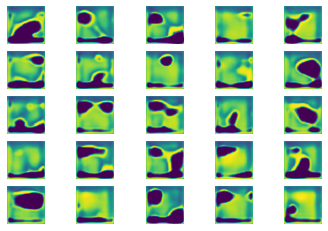

EPOCH: 2 BATCH: 1 d_loss1: 0.21363157033920288 d_loss2: 0.7287970781326294 g_loss: 1.5416886806488037
EPOCH: 2 BATCH: 2 d_loss1: 0.5326452255249023 d_loss2: 0.3465871512889862 g_loss: 1.2791404724121094
EPOCH: 2 BATCH: 3 d_loss1: 0.5052391886711121 d_loss2: 0.417127400636673 g_loss: 0.8007618188858032
EPOCH: 2 BATCH: 4 d_loss1: 0.45746514201164246 d_loss2: 0.30061522126197815 g_loss: 0.8385654091835022
EPOCH: 2 BATCH: 5 d_loss1: 0.6021405458450317 d_loss2: 0.5008518099784851 g_loss: 0.6449968814849854
EPOCH: 2 BATCH: 6 d_loss1: 0.5082955956459045 d_loss2: 0.5188316702842712 g_loss: 0.9736710786819458
EPOCH: 2 BATCH: 7 d_loss1: 0.5887757539749146 d_loss2: 0.36710166931152344 g_loss: 0.826116681098938
EPOCH: 2 BATCH: 8 d_loss1: 0.652705729007721 d_loss2: 0.39155030250549316 g_loss: 0.7318176031112671
EPOCH: 2 BATCH: 9 d_loss1: 0.5040202736854553 d_loss2: 0.7099982500076294 g_loss: 0.7716144323348999
EPOCH: 2 BATCH: 10 d_loss1: 0.5845426321029663 d_loss2: 0.6289588212966919 g_loss: 0.7615

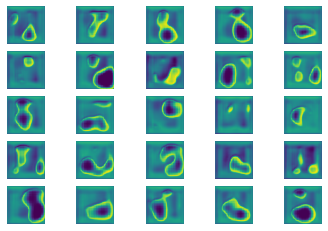

EPOCH: 3 BATCH: 1 d_loss1: 0.23399627208709717 d_loss2: 0.707289457321167 g_loss: 0.8279975652694702
EPOCH: 3 BATCH: 2 d_loss1: 0.6527007818222046 d_loss2: 1.0101561546325684 g_loss: 0.451185405254364
EPOCH: 3 BATCH: 3 d_loss1: 0.5197960734367371 d_loss2: 0.9407723546028137 g_loss: 0.5179382562637329
EPOCH: 3 BATCH: 4 d_loss1: 0.5847492218017578 d_loss2: 0.5876593589782715 g_loss: 0.3708930015563965
EPOCH: 3 BATCH: 5 d_loss1: 0.5937669277191162 d_loss2: 0.9109775424003601 g_loss: 0.29887834191322327
EPOCH: 3 BATCH: 6 d_loss1: 0.5040017366409302 d_loss2: 1.355818748474121 g_loss: 0.4913845360279083
EPOCH: 3 BATCH: 7 d_loss1: 1.0152368545532227 d_loss2: 0.8404918909072876 g_loss: 1.1551704406738281
EPOCH: 3 BATCH: 8 d_loss1: 0.5887635946273804 d_loss2: 0.6006687879562378 g_loss: 1.1195842027664185
EPOCH: 3 BATCH: 9 d_loss1: 0.6739528179168701 d_loss2: 0.8013231754302979 g_loss: 0.7044633626937866
EPOCH: 3 BATCH: 10 d_loss1: 0.6883933544158936 d_loss2: 0.6337851285934448 g_loss: 0.8434750

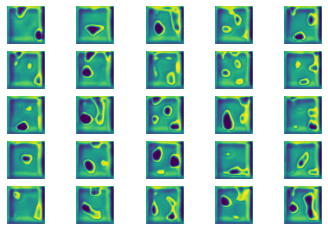

EPOCH: 4 BATCH: 1 d_loss1: 0.47813063859939575 d_loss2: 1.6320677995681763 g_loss: 0.802398681640625
EPOCH: 4 BATCH: 2 d_loss1: 0.7178136110305786 d_loss2: 0.9434592127799988 g_loss: 1.4913530349731445
EPOCH: 4 BATCH: 3 d_loss1: 0.8982207775115967 d_loss2: 0.3680710196495056 g_loss: 1.5527292490005493
EPOCH: 4 BATCH: 4 d_loss1: 0.47982096672058105 d_loss2: 0.7144695520401001 g_loss: 1.6083769798278809
EPOCH: 4 BATCH: 5 d_loss1: 0.693820595741272 d_loss2: 0.39523956179618835 g_loss: 1.8385218381881714
EPOCH: 4 BATCH: 6 d_loss1: 0.5672428607940674 d_loss2: 0.13897185027599335 g_loss: 1.6272199153900146
EPOCH: 4 BATCH: 7 d_loss1: 0.704876184463501 d_loss2: 0.16797514259815216 g_loss: 1.0681300163269043
EPOCH: 4 BATCH: 8 d_loss1: 0.4953773617744446 d_loss2: 0.3080669045448303 g_loss: 0.7754465341567993
EPOCH: 4 BATCH: 9 d_loss1: 0.48384571075439453 d_loss2: 0.5839306116104126 g_loss: 0.5885307788848877
EPOCH: 4 BATCH: 10 d_loss1: 0.598868727684021 d_loss2: 1.1700626611709595 g_loss: 0.6738

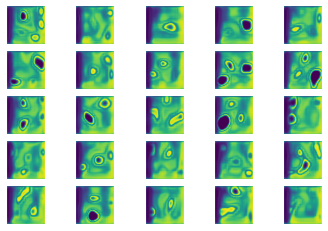

EPOCH: 5 BATCH: 1 d_loss1: 0.687585711479187 d_loss2: 0.6053211688995361 g_loss: 1.1429855823516846
EPOCH: 5 BATCH: 2 d_loss1: 0.5433429479598999 d_loss2: 0.34621280431747437 g_loss: 1.7565923929214478
EPOCH: 5 BATCH: 3 d_loss1: 0.3976372182369232 d_loss2: 0.3319549560546875 g_loss: 1.7078509330749512
EPOCH: 5 BATCH: 4 d_loss1: 0.44234439730644226 d_loss2: 0.6852878332138062 g_loss: 1.1468334197998047
EPOCH: 5 BATCH: 5 d_loss1: 0.6391514539718628 d_loss2: 1.3014848232269287 g_loss: 1.042457103729248
EPOCH: 5 BATCH: 6 d_loss1: 0.6958914995193481 d_loss2: 0.779353141784668 g_loss: 1.695107102394104
EPOCH: 5 BATCH: 7 d_loss1: 0.7664282321929932 d_loss2: 0.49559837579727173 g_loss: 1.4526093006134033
EPOCH: 5 BATCH: 8 d_loss1: 0.6847718358039856 d_loss2: 0.9583919048309326 g_loss: 1.6618082523345947
EPOCH: 5 BATCH: 9 d_loss1: 0.4271591901779175 d_loss2: 0.16667087376117706 g_loss: 2.397646903991699
EPOCH: 5 BATCH: 10 d_loss1: 0.46423619985580444 d_loss2: 0.269900918006897 g_loss: 2.4346127

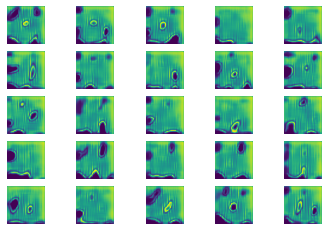

EPOCH: 6 BATCH: 1 d_loss1: 0.3781857490539551 d_loss2: 0.6525025367736816 g_loss: 1.1391570568084717
EPOCH: 6 BATCH: 2 d_loss1: 0.528793454170227 d_loss2: 0.545740008354187 g_loss: 1.6605199575424194
EPOCH: 6 BATCH: 3 d_loss1: 1.0061837434768677 d_loss2: 0.45052409172058105 g_loss: 1.5760225057601929
EPOCH: 6 BATCH: 4 d_loss1: 0.690172553062439 d_loss2: 0.5441427230834961 g_loss: 1.6749918460845947
EPOCH: 6 BATCH: 5 d_loss1: 0.46213769912719727 d_loss2: 0.7001859545707703 g_loss: 2.145498752593994
EPOCH: 6 BATCH: 6 d_loss1: 0.8978944420814514 d_loss2: 0.2478030025959015 g_loss: 2.5734643936157227
EPOCH: 6 BATCH: 7 d_loss1: 0.628849446773529 d_loss2: 0.2904476523399353 g_loss: 1.6267169713974
EPOCH: 6 BATCH: 8 d_loss1: 0.5835773348808289 d_loss2: 0.5564457178115845 g_loss: 1.7364490032196045
EPOCH: 6 BATCH: 9 d_loss1: 0.6415421962738037 d_loss2: 0.21541868150234222 g_loss: 1.63005530834198
EPOCH: 6 BATCH: 10 d_loss1: 0.4860978126525879 d_loss2: 0.23362934589385986 g_loss: 1.178946614265

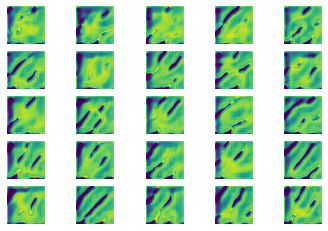

EPOCH: 7 BATCH: 1 d_loss1: 0.6557371020317078 d_loss2: 0.5808900594711304 g_loss: 1.2917380332946777
EPOCH: 7 BATCH: 2 d_loss1: 0.5781477093696594 d_loss2: 0.8595130443572998 g_loss: 1.2612344026565552
EPOCH: 7 BATCH: 3 d_loss1: 0.7991400957107544 d_loss2: 0.9630963802337646 g_loss: 2.0748465061187744
EPOCH: 7 BATCH: 4 d_loss1: 0.8636313080787659 d_loss2: 0.07106056809425354 g_loss: 4.006072044372559
EPOCH: 7 BATCH: 5 d_loss1: 0.4214026927947998 d_loss2: 0.31009119749069214 g_loss: 2.2281270027160645
EPOCH: 7 BATCH: 6 d_loss1: 0.27903443574905396 d_loss2: 0.3193753957748413 g_loss: 1.30470609664917
EPOCH: 7 BATCH: 7 d_loss1: 0.8533828258514404 d_loss2: 0.4394093155860901 g_loss: 1.1945762634277344
EPOCH: 7 BATCH: 8 d_loss1: 0.6363691687583923 d_loss2: 0.3712342381477356 g_loss: 1.5072228908538818
EPOCH: 7 BATCH: 9 d_loss1: 0.5351044535636902 d_loss2: 0.3644754886627197 g_loss: 1.5920751094818115
EPOCH: 7 BATCH: 10 d_loss1: 0.39509499073028564 d_loss2: 0.3718148469924927 g_loss: 1.83704

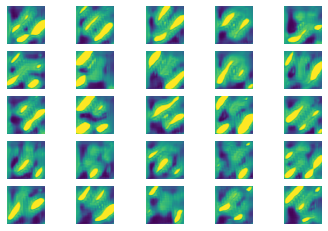

EPOCH: 8 BATCH: 1 d_loss1: 0.3673137128353119 d_loss2: 0.4597388505935669 g_loss: 1.337537407875061
EPOCH: 8 BATCH: 2 d_loss1: 0.14945441484451294 d_loss2: 0.5554704666137695 g_loss: 1.7257063388824463
EPOCH: 8 BATCH: 3 d_loss1: 0.7360208034515381 d_loss2: 0.4148041009902954 g_loss: 1.760024070739746
EPOCH: 8 BATCH: 4 d_loss1: 0.5158973932266235 d_loss2: 0.44570380449295044 g_loss: 1.5118272304534912
EPOCH: 8 BATCH: 5 d_loss1: 0.40832987427711487 d_loss2: 0.33324378728866577 g_loss: 1.481659173965454
EPOCH: 8 BATCH: 6 d_loss1: 0.33701539039611816 d_loss2: 0.2737521529197693 g_loss: 1.294174313545227
EPOCH: 8 BATCH: 7 d_loss1: 0.5260827541351318 d_loss2: 0.4662730097770691 g_loss: 0.9017208218574524
EPOCH: 8 BATCH: 8 d_loss1: 0.4597127437591553 d_loss2: 0.43202266097068787 g_loss: 0.7014539837837219
EPOCH: 8 BATCH: 9 d_loss1: 0.4528924226760864 d_loss2: 0.5683237314224243 g_loss: 0.7464660406112671
EPOCH: 8 BATCH: 10 d_loss1: 0.448737770318985 d_loss2: 0.5316805839538574 g_loss: 0.77647

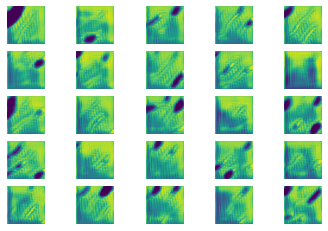

EPOCH: 9 BATCH: 1 d_loss1: 0.44494327902793884 d_loss2: 0.37854254245758057 g_loss: 1.3332433700561523
EPOCH: 9 BATCH: 2 d_loss1: 0.6293982267379761 d_loss2: 0.7112294435501099 g_loss: 0.9733151197433472
EPOCH: 9 BATCH: 3 d_loss1: 0.5602524280548096 d_loss2: 0.5506319999694824 g_loss: 0.8345434665679932
EPOCH: 9 BATCH: 4 d_loss1: 0.9486059546470642 d_loss2: 0.5142627954483032 g_loss: 0.5505362749099731
EPOCH: 9 BATCH: 5 d_loss1: 0.4501452147960663 d_loss2: 0.5760165452957153 g_loss: 0.6282366514205933
EPOCH: 9 BATCH: 6 d_loss1: 0.4222480356693268 d_loss2: 0.5522642135620117 g_loss: 0.829390287399292
EPOCH: 9 BATCH: 7 d_loss1: 0.5826903581619263 d_loss2: 0.4851590394973755 g_loss: 1.2111048698425293
EPOCH: 9 BATCH: 8 d_loss1: 0.561255931854248 d_loss2: 0.43432873487472534 g_loss: 1.44057297706604
EPOCH: 9 BATCH: 9 d_loss1: 0.646708071231842 d_loss2: 0.5328400135040283 g_loss: 1.4200164079666138
EPOCH: 9 BATCH: 10 d_loss1: 0.665621280670166 d_loss2: 0.4856855273246765 g_loss: 1.425062060

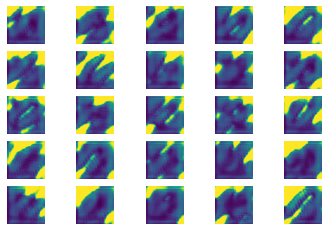

EPOCH: 10 BATCH: 1 d_loss1: 0.7697597146034241 d_loss2: 0.23556336760520935 g_loss: 1.703020691871643
EPOCH: 10 BATCH: 2 d_loss1: 0.5604414343833923 d_loss2: 0.3150080442428589 g_loss: 1.2127950191497803
EPOCH: 10 BATCH: 3 d_loss1: 0.49816298484802246 d_loss2: 0.45032867789268494 g_loss: 0.8769786953926086
EPOCH: 10 BATCH: 4 d_loss1: 0.35280975699424744 d_loss2: 0.5104501843452454 g_loss: 0.935192346572876
EPOCH: 10 BATCH: 5 d_loss1: 0.349033385515213 d_loss2: 0.5184816122055054 g_loss: 1.0218102931976318
EPOCH: 10 BATCH: 6 d_loss1: 0.5133262276649475 d_loss2: 0.7148311138153076 g_loss: 1.0275744199752808
EPOCH: 10 BATCH: 7 d_loss1: 0.4555584788322449 d_loss2: 0.5422174334526062 g_loss: 0.7817631959915161
EPOCH: 10 BATCH: 8 d_loss1: 0.6227748394012451 d_loss2: 0.4066139757633209 g_loss: 0.8505135774612427
EPOCH: 10 BATCH: 9 d_loss1: 0.49018752574920654 d_loss2: 0.30676066875457764 g_loss: 0.6756464838981628
EPOCH: 10 BATCH: 10 d_loss1: 0.5232664346694946 d_loss2: 0.3785766065120697 g_l

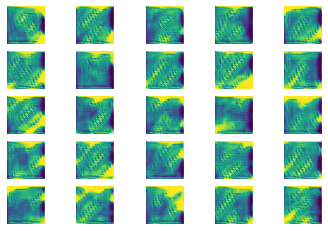

EPOCH: 11 BATCH: 1 d_loss1: 0.7877165079116821 d_loss2: 0.45578378438949585 g_loss: 2.0984420776367188
EPOCH: 11 BATCH: 2 d_loss1: 0.49386727809906006 d_loss2: 0.6021909713745117 g_loss: 1.5690414905548096
EPOCH: 11 BATCH: 3 d_loss1: 0.6057462096214294 d_loss2: 1.3662190437316895 g_loss: 1.016566276550293
EPOCH: 11 BATCH: 4 d_loss1: 0.5595744848251343 d_loss2: 0.5637543201446533 g_loss: 1.2204389572143555
EPOCH: 11 BATCH: 5 d_loss1: 0.6248373985290527 d_loss2: 0.4024943709373474 g_loss: 1.0983457565307617
EPOCH: 11 BATCH: 6 d_loss1: 0.9738584756851196 d_loss2: 0.5285407900810242 g_loss: 1.0952106714248657
EPOCH: 11 BATCH: 7 d_loss1: 0.715139627456665 d_loss2: 0.48740002512931824 g_loss: 1.1519049406051636
EPOCH: 11 BATCH: 8 d_loss1: 0.6105595827102661 d_loss2: 0.48510193824768066 g_loss: 1.3808975219726562
EPOCH: 11 BATCH: 9 d_loss1: 0.541022539138794 d_loss2: 0.34643489122390747 g_loss: 1.5042921304702759
EPOCH: 11 BATCH: 10 d_loss1: 0.7680566310882568 d_loss2: 0.35851752758026123 g_l

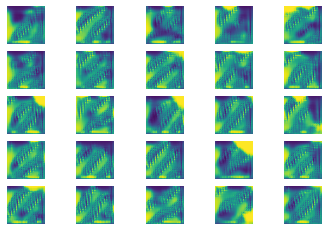

EPOCH: 12 BATCH: 1 d_loss1: 0.47912025451660156 d_loss2: 0.661811351776123 g_loss: 0.8826754093170166
EPOCH: 12 BATCH: 2 d_loss1: 0.7864418625831604 d_loss2: 1.1726069450378418 g_loss: 0.9591120481491089
EPOCH: 12 BATCH: 3 d_loss1: 0.7919695973396301 d_loss2: 0.6372211575508118 g_loss: 0.8061463832855225
EPOCH: 12 BATCH: 4 d_loss1: 0.913766086101532 d_loss2: 0.7953575253486633 g_loss: 0.7010443210601807
EPOCH: 12 BATCH: 5 d_loss1: 0.8245232701301575 d_loss2: 0.608863890171051 g_loss: 0.9938294291496277
EPOCH: 12 BATCH: 6 d_loss1: 0.9843600988388062 d_loss2: 0.665281355381012 g_loss: 1.2058019638061523
EPOCH: 12 BATCH: 7 d_loss1: 0.8219780921936035 d_loss2: 0.5064336061477661 g_loss: 1.3272249698638916
EPOCH: 12 BATCH: 8 d_loss1: 0.6951606273651123 d_loss2: 0.7210065126419067 g_loss: 1.5784238576889038
EPOCH: 12 BATCH: 9 d_loss1: 1.2410186529159546 d_loss2: 0.8589655160903931 g_loss: 1.6643916368484497
EPOCH: 12 BATCH: 10 d_loss1: 1.063718318939209 d_loss2: 0.3979077637195587 g_loss: 1.

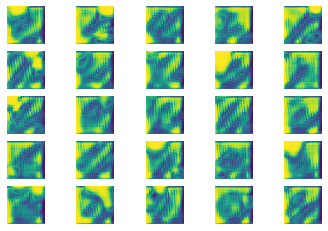

EPOCH: 13 BATCH: 1 d_loss1: 0.3391513228416443 d_loss2: 0.6174917817115784 g_loss: 1.5421957969665527
EPOCH: 13 BATCH: 2 d_loss1: 0.45693740248680115 d_loss2: 0.5456943511962891 g_loss: 1.0746476650238037
EPOCH: 13 BATCH: 3 d_loss1: 0.6247986555099487 d_loss2: 0.831039309501648 g_loss: 1.3359802961349487
EPOCH: 13 BATCH: 4 d_loss1: 0.7147911787033081 d_loss2: 0.4219462275505066 g_loss: 1.2009496688842773
EPOCH: 13 BATCH: 5 d_loss1: 0.46974092721939087 d_loss2: 0.509859561920166 g_loss: 1.3170909881591797
EPOCH: 13 BATCH: 6 d_loss1: 0.518936038017273 d_loss2: 0.4936389923095703 g_loss: 1.3316287994384766
EPOCH: 13 BATCH: 7 d_loss1: 0.7277612686157227 d_loss2: 0.909386932849884 g_loss: 1.4537839889526367
EPOCH: 13 BATCH: 8 d_loss1: 0.8860611915588379 d_loss2: 0.3295336961746216 g_loss: 1.1978309154510498
EPOCH: 13 BATCH: 9 d_loss1: 1.1094661951065063 d_loss2: 0.5447969436645508 g_loss: 1.3561933040618896
EPOCH: 13 BATCH: 10 d_loss1: 0.9751492738723755 d_loss2: 0.2576338052749634 g_loss: 

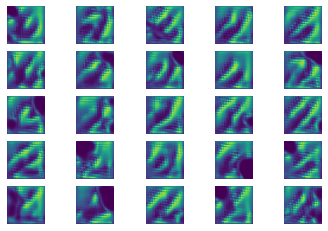

EPOCH: 14 BATCH: 1 d_loss1: 0.806786835193634 d_loss2: 0.6322817802429199 g_loss: 1.330133318901062
EPOCH: 14 BATCH: 2 d_loss1: 0.48231935501098633 d_loss2: 0.8646591901779175 g_loss: 1.5078104734420776
EPOCH: 14 BATCH: 3 d_loss1: 0.3781099319458008 d_loss2: 0.4189794957637787 g_loss: 1.9637963771820068
EPOCH: 14 BATCH: 4 d_loss1: 0.6481300592422485 d_loss2: 0.27271324396133423 g_loss: 1.5124812126159668
EPOCH: 14 BATCH: 5 d_loss1: 0.5673264265060425 d_loss2: 1.0652058124542236 g_loss: 1.702418327331543
EPOCH: 14 BATCH: 6 d_loss1: 0.6536912322044373 d_loss2: 0.4687555432319641 g_loss: 1.5438504219055176
EPOCH: 14 BATCH: 7 d_loss1: 0.8530458807945251 d_loss2: 0.22059711813926697 g_loss: 1.3238781690597534
EPOCH: 14 BATCH: 8 d_loss1: 0.8382377028465271 d_loss2: 0.250044047832489 g_loss: 0.9661766886711121
EPOCH: 14 BATCH: 9 d_loss1: 0.7368232011795044 d_loss2: 0.20127680897712708 g_loss: 0.5241314768791199
EPOCH: 14 BATCH: 10 d_loss1: 0.43407514691352844 d_loss2: 0.19992034137248993 g_lo

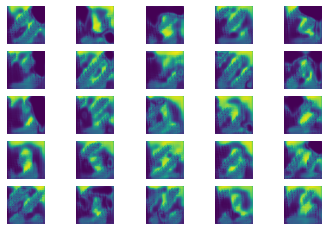

EPOCH: 15 BATCH: 1 d_loss1: 0.7710601687431335 d_loss2: 0.6300977468490601 g_loss: 1.3298754692077637
EPOCH: 15 BATCH: 2 d_loss1: 0.71244215965271 d_loss2: 0.7484756708145142 g_loss: 2.129406452178955
EPOCH: 15 BATCH: 3 d_loss1: 0.8712198734283447 d_loss2: 0.2225174903869629 g_loss: 2.220670700073242
EPOCH: 15 BATCH: 4 d_loss1: 0.6556605696678162 d_loss2: 0.21766604483127594 g_loss: 1.255974531173706
EPOCH: 15 BATCH: 5 d_loss1: 0.6130868196487427 d_loss2: 0.5025559067726135 g_loss: 0.7835104465484619
EPOCH: 15 BATCH: 6 d_loss1: 0.6464954018592834 d_loss2: 0.6170910000801086 g_loss: 0.5546151399612427
EPOCH: 15 BATCH: 7 d_loss1: 0.6785628199577332 d_loss2: 0.6685898900032043 g_loss: 0.3679302930831909
EPOCH: 15 BATCH: 8 d_loss1: 0.48210158944129944 d_loss2: 0.3961631953716278 g_loss: 0.3544914126396179
EPOCH: 15 BATCH: 9 d_loss1: 0.5745881795883179 d_loss2: 0.3185049891471863 g_loss: 0.28502243757247925
EPOCH: 15 BATCH: 10 d_loss1: 0.9108221530914307 d_loss2: 0.3482729196548462 g_loss: 

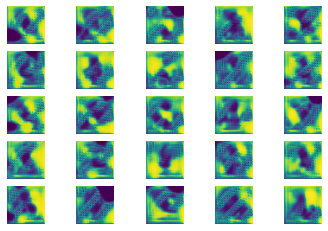

EPOCH: 16 BATCH: 1 d_loss1: 0.7304184436798096 d_loss2: 0.40774986147880554 g_loss: 0.8516676425933838
EPOCH: 16 BATCH: 2 d_loss1: 0.5534808039665222 d_loss2: 0.46530652046203613 g_loss: 1.0901626348495483
EPOCH: 16 BATCH: 3 d_loss1: 0.3422800898551941 d_loss2: 0.6903692483901978 g_loss: 1.20500910282135
EPOCH: 16 BATCH: 4 d_loss1: 0.3495725393295288 d_loss2: 0.508588433265686 g_loss: 1.3230345249176025
EPOCH: 16 BATCH: 5 d_loss1: 0.3140929341316223 d_loss2: 0.6157704591751099 g_loss: 2.482412815093994
EPOCH: 16 BATCH: 6 d_loss1: 0.5747212767601013 d_loss2: 0.13303786516189575 g_loss: 3.073232650756836
EPOCH: 16 BATCH: 7 d_loss1: 0.5873501300811768 d_loss2: 0.23975220322608948 g_loss: 2.6700830459594727
EPOCH: 16 BATCH: 8 d_loss1: 0.5561148524284363 d_loss2: 0.2994462251663208 g_loss: 2.263139486312866
EPOCH: 16 BATCH: 9 d_loss1: 0.3845515251159668 d_loss2: 0.34077227115631104 g_loss: 1.9941236972808838
EPOCH: 16 BATCH: 10 d_loss1: 0.3055855631828308 d_loss2: 0.27220043540000916 g_loss

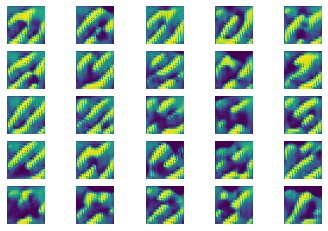

EPOCH: 17 BATCH: 1 d_loss1: 0.4437790513038635 d_loss2: 0.22285419702529907 g_loss: 1.2863805294036865
EPOCH: 17 BATCH: 2 d_loss1: 0.41617417335510254 d_loss2: 0.3889351189136505 g_loss: 1.030527949333191
EPOCH: 17 BATCH: 3 d_loss1: 0.5150413513183594 d_loss2: 0.4922104775905609 g_loss: 1.0487544536590576
EPOCH: 17 BATCH: 4 d_loss1: 0.3677239418029785 d_loss2: 0.3949684500694275 g_loss: 1.1654233932495117
EPOCH: 17 BATCH: 5 d_loss1: 0.3268718123435974 d_loss2: 0.5288134813308716 g_loss: 1.219444751739502
EPOCH: 17 BATCH: 6 d_loss1: 0.5090528726577759 d_loss2: 0.6184165477752686 g_loss: 0.9729663133621216
EPOCH: 17 BATCH: 7 d_loss1: 0.7227542400360107 d_loss2: 0.655154824256897 g_loss: 1.4375078678131104
EPOCH: 17 BATCH: 8 d_loss1: 0.7640359401702881 d_loss2: 0.6095736026763916 g_loss: 1.2453527450561523
EPOCH: 17 BATCH: 9 d_loss1: 0.5727233290672302 d_loss2: 0.4929996430873871 g_loss: 1.0677493810653687
EPOCH: 17 BATCH: 10 d_loss1: 0.7080763578414917 d_loss2: 0.5257209539413452 g_loss:

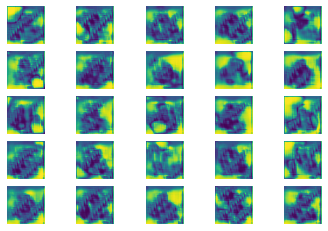

EPOCH: 18 BATCH: 1 d_loss1: 0.5731010437011719 d_loss2: 0.156301349401474 g_loss: 1.4414949417114258
EPOCH: 18 BATCH: 2 d_loss1: 0.5968391299247742 d_loss2: 0.33111321926116943 g_loss: 1.7574535608291626
EPOCH: 18 BATCH: 3 d_loss1: 0.5801602005958557 d_loss2: 0.10086237639188766 g_loss: 1.6483969688415527
EPOCH: 18 BATCH: 4 d_loss1: 0.6120703220367432 d_loss2: 0.2486932873725891 g_loss: 1.6296956539154053
EPOCH: 18 BATCH: 5 d_loss1: 0.4650067389011383 d_loss2: 0.21626177430152893 g_loss: 1.075796365737915
EPOCH: 18 BATCH: 6 d_loss1: 0.35355663299560547 d_loss2: 1.1545695066452026 g_loss: 1.2797904014587402
EPOCH: 18 BATCH: 7 d_loss1: 0.34444576501846313 d_loss2: 0.9110516905784607 g_loss: 2.185196876525879
EPOCH: 18 BATCH: 8 d_loss1: 0.8294946551322937 d_loss2: 0.274686336517334 g_loss: 2.060084819793701
EPOCH: 18 BATCH: 9 d_loss1: 0.792267918586731 d_loss2: 0.24684521555900574 g_loss: 1.555345058441162
EPOCH: 18 BATCH: 10 d_loss1: 0.7105494141578674 d_loss2: 0.33760055899620056 g_loss

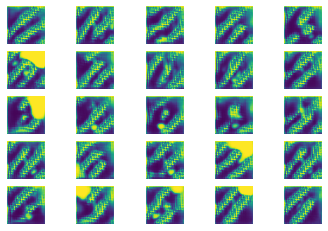

EPOCH: 19 BATCH: 1 d_loss1: 0.3453837037086487 d_loss2: 0.3031995892524719 g_loss: 0.3610788583755493
EPOCH: 19 BATCH: 2 d_loss1: 0.39034461975097656 d_loss2: 0.259242981672287 g_loss: 0.5802826881408691
EPOCH: 19 BATCH: 3 d_loss1: 0.5079603791236877 d_loss2: 0.26725226640701294 g_loss: 0.8030651807785034
EPOCH: 19 BATCH: 4 d_loss1: 0.6109603643417358 d_loss2: 0.4723304212093353 g_loss: 1.3542113304138184
EPOCH: 19 BATCH: 5 d_loss1: 0.556442379951477 d_loss2: 0.41090089082717896 g_loss: 2.2676198482513428
EPOCH: 19 BATCH: 6 d_loss1: 0.5616257786750793 d_loss2: 0.3725970387458801 g_loss: 3.075986385345459
EPOCH: 19 BATCH: 7 d_loss1: 0.9927818775177002 d_loss2: 0.30318039655685425 g_loss: 2.9696247577667236
EPOCH: 19 BATCH: 8 d_loss1: 1.2465052604675293 d_loss2: 1.330946922302246 g_loss: 3.3402767181396484
EPOCH: 19 BATCH: 9 d_loss1: 0.7470074892044067 d_loss2: 0.05512203276157379 g_loss: 3.335007905960083
EPOCH: 19 BATCH: 10 d_loss1: 0.9680109024047852 d_loss2: 0.4130629897117615 g_loss

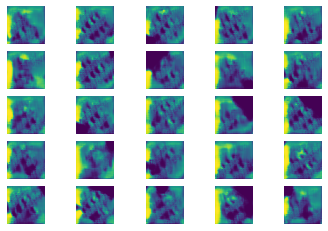

EPOCH: 20 BATCH: 1 d_loss1: 0.9167039394378662 d_loss2: 0.35377904772758484 g_loss: 1.8669837713241577
EPOCH: 20 BATCH: 2 d_loss1: 0.7227625846862793 d_loss2: 0.6000186204910278 g_loss: 1.0167794227600098
EPOCH: 20 BATCH: 3 d_loss1: 0.5575520992279053 d_loss2: 0.5674693584442139 g_loss: 0.8554397821426392
EPOCH: 20 BATCH: 4 d_loss1: 0.4887194335460663 d_loss2: 0.7632772922515869 g_loss: 1.2843610048294067
EPOCH: 20 BATCH: 5 d_loss1: 0.4764173626899719 d_loss2: 0.31814706325531006 g_loss: 1.8438571691513062
EPOCH: 20 BATCH: 6 d_loss1: 0.4203134775161743 d_loss2: 0.18235737085342407 g_loss: 2.080897808074951
EPOCH: 20 BATCH: 7 d_loss1: 0.5179954767227173 d_loss2: 0.2268071174621582 g_loss: 1.6573991775512695
EPOCH: 20 BATCH: 8 d_loss1: 0.42335858941078186 d_loss2: 0.3699157238006592 g_loss: 1.7035744190216064
EPOCH: 20 BATCH: 9 d_loss1: 0.31782978773117065 d_loss2: 0.3789481222629547 g_loss: 1.944956660270691
EPOCH: 20 BATCH: 10 d_loss1: 0.2466517984867096 d_loss2: 0.48907214403152466 g_

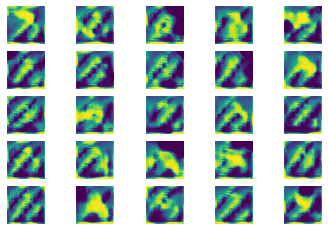

EPOCH: 21 BATCH: 1 d_loss1: 0.631659746170044 d_loss2: 0.490850031375885 g_loss: 1.1344738006591797
EPOCH: 21 BATCH: 2 d_loss1: 1.1829147338867188 d_loss2: 0.5225478410720825 g_loss: 1.384782075881958
EPOCH: 21 BATCH: 3 d_loss1: 0.8738259673118591 d_loss2: 0.37916556000709534 g_loss: 1.8544588088989258
EPOCH: 21 BATCH: 4 d_loss1: 0.7456629276275635 d_loss2: 0.4352206587791443 g_loss: 2.2288360595703125
EPOCH: 21 BATCH: 5 d_loss1: 0.8169716000556946 d_loss2: 0.5497211813926697 g_loss: 1.864486575126648
EPOCH: 21 BATCH: 6 d_loss1: 0.6669230461120605 d_loss2: 0.7221235632896423 g_loss: 1.9081376791000366
EPOCH: 21 BATCH: 7 d_loss1: 0.6496617197990417 d_loss2: 0.4944743514060974 g_loss: 1.6424791812896729
EPOCH: 21 BATCH: 8 d_loss1: 0.8376080989837646 d_loss2: 0.3985790014266968 g_loss: 1.473139762878418
EPOCH: 21 BATCH: 9 d_loss1: 0.7538160085678101 d_loss2: 0.3598441183567047 g_loss: 1.3931015729904175
EPOCH: 21 BATCH: 10 d_loss1: 0.517103374004364 d_loss2: 0.3752177655696869 g_loss: 1.3

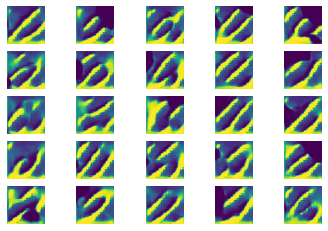

EPOCH: 22 BATCH: 1 d_loss1: 0.6232908368110657 d_loss2: 0.3305354118347168 g_loss: 1.7103760242462158
EPOCH: 22 BATCH: 2 d_loss1: 0.5681689977645874 d_loss2: 0.31849831342697144 g_loss: 1.3681999444961548
EPOCH: 22 BATCH: 3 d_loss1: 0.45292845368385315 d_loss2: 0.39609694480895996 g_loss: 1.3978790044784546
EPOCH: 22 BATCH: 4 d_loss1: 0.4072708487510681 d_loss2: 0.4408652186393738 g_loss: 1.1073566675186157
EPOCH: 22 BATCH: 5 d_loss1: 0.6439501047134399 d_loss2: 0.8457553386688232 g_loss: 0.8891097903251648
EPOCH: 22 BATCH: 6 d_loss1: 0.7694122791290283 d_loss2: 0.7720551490783691 g_loss: 1.0787956714630127
EPOCH: 22 BATCH: 7 d_loss1: 0.4982406497001648 d_loss2: 0.4338124692440033 g_loss: 1.315192699432373
EPOCH: 22 BATCH: 8 d_loss1: 0.5835429430007935 d_loss2: 0.36458367109298706 g_loss: 1.4917064905166626
EPOCH: 22 BATCH: 9 d_loss1: 0.5115576982498169 d_loss2: 0.4303247332572937 g_loss: 1.4389126300811768
EPOCH: 22 BATCH: 10 d_loss1: 0.43803611397743225 d_loss2: 0.42600083351135254 g

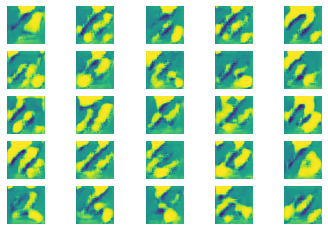

EPOCH: 23 BATCH: 1 d_loss1: 0.1189340204000473 d_loss2: 0.452191025018692 g_loss: 1.178853988647461
EPOCH: 23 BATCH: 2 d_loss1: 0.21143358945846558 d_loss2: 1.0077593326568604 g_loss: 0.7745803594589233
EPOCH: 23 BATCH: 3 d_loss1: 0.5850225687026978 d_loss2: 1.1173231601715088 g_loss: 0.6527724266052246
EPOCH: 23 BATCH: 4 d_loss1: 0.7095022201538086 d_loss2: 1.3823013305664062 g_loss: 1.07882821559906
EPOCH: 23 BATCH: 5 d_loss1: 0.6411094069480896 d_loss2: 0.4902975857257843 g_loss: 1.9228512048721313
EPOCH: 23 BATCH: 6 d_loss1: 0.8827581405639648 d_loss2: 0.22207768261432648 g_loss: 1.9118375778198242
EPOCH: 23 BATCH: 7 d_loss1: 0.608818531036377 d_loss2: 0.21245494484901428 g_loss: 1.4993407726287842
EPOCH: 23 BATCH: 8 d_loss1: 0.5517749190330505 d_loss2: 0.21757659316062927 g_loss: 0.5539305210113525
EPOCH: 23 BATCH: 9 d_loss1: 0.40454983711242676 d_loss2: 0.23424775898456573 g_loss: 0.4186806082725525
EPOCH: 23 BATCH: 10 d_loss1: 0.3458452522754669 d_loss2: 0.3252439796924591 g_los

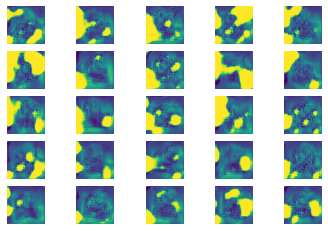

EPOCH: 24 BATCH: 1 d_loss1: 0.32192158699035645 d_loss2: 0.5951567888259888 g_loss: 0.6303339004516602
EPOCH: 24 BATCH: 2 d_loss1: 0.42548930644989014 d_loss2: 0.9205573797225952 g_loss: 0.5928018093109131
EPOCH: 24 BATCH: 3 d_loss1: 0.5854151248931885 d_loss2: 0.6494324207305908 g_loss: 0.7323542237281799
EPOCH: 24 BATCH: 4 d_loss1: 0.8396183252334595 d_loss2: 1.047105312347412 g_loss: 0.6749907732009888
EPOCH: 24 BATCH: 5 d_loss1: 1.0327296257019043 d_loss2: 0.9216222167015076 g_loss: 0.7121971249580383
EPOCH: 24 BATCH: 6 d_loss1: 0.640274167060852 d_loss2: 0.8807040452957153 g_loss: 0.5514606833457947
EPOCH: 24 BATCH: 7 d_loss1: 0.6325159668922424 d_loss2: 0.735632598400116 g_loss: 0.6579546332359314
EPOCH: 24 BATCH: 8 d_loss1: 0.5467944741249084 d_loss2: 0.747545599937439 g_loss: 0.7802979350090027
EPOCH: 24 BATCH: 9 d_loss1: 0.7789011001586914 d_loss2: 0.6410332322120667 g_loss: 0.5827057361602783
EPOCH: 24 BATCH: 10 d_loss1: 0.596750020980835 d_loss2: 0.67387855052948 g_loss: 0.4

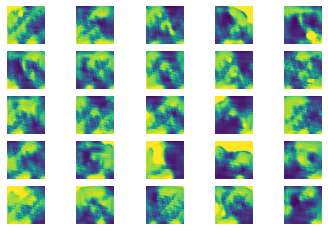

EPOCH: 25 BATCH: 1 d_loss1: 0.9758373498916626 d_loss2: 0.6237091422080994 g_loss: 1.0992544889450073
EPOCH: 25 BATCH: 2 d_loss1: 0.8116415739059448 d_loss2: 0.6406296491622925 g_loss: 1.1324164867401123
EPOCH: 25 BATCH: 3 d_loss1: 0.9895573854446411 d_loss2: 0.6892491579055786 g_loss: 1.044394612312317
EPOCH: 25 BATCH: 4 d_loss1: 0.8166838884353638 d_loss2: 0.6139652729034424 g_loss: 1.1489098072052002
EPOCH: 25 BATCH: 5 d_loss1: 0.5457984209060669 d_loss2: 0.4297325611114502 g_loss: 1.1259815692901611
EPOCH: 25 BATCH: 6 d_loss1: 1.032287359237671 d_loss2: 0.6689464449882507 g_loss: 1.0376681089401245
EPOCH: 25 BATCH: 7 d_loss1: 0.7915385365486145 d_loss2: 0.6337343454360962 g_loss: 1.230852484703064
EPOCH: 25 BATCH: 8 d_loss1: 0.8696064949035645 d_loss2: 0.5497647523880005 g_loss: 1.1180685758590698
EPOCH: 25 BATCH: 9 d_loss1: 0.7865135073661804 d_loss2: 0.6624996066093445 g_loss: 1.0934422016143799
EPOCH: 25 BATCH: 10 d_loss1: 0.7279843091964722 d_loss2: 0.6633273363113403 g_loss: 1

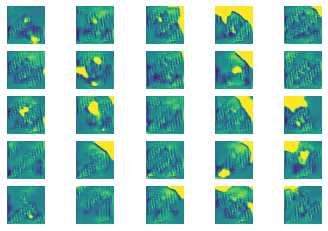

EPOCH: 26 BATCH: 1 d_loss1: 0.6056863069534302 d_loss2: 0.6510552763938904 g_loss: 0.9860556125640869
EPOCH: 26 BATCH: 2 d_loss1: 0.9203342199325562 d_loss2: 0.4813424348831177 g_loss: 1.1759246587753296
EPOCH: 26 BATCH: 3 d_loss1: 0.5246677398681641 d_loss2: 0.454688161611557 g_loss: 1.4887136220932007
EPOCH: 26 BATCH: 4 d_loss1: 0.6039713025093079 d_loss2: 0.4175402522087097 g_loss: 1.0893049240112305
EPOCH: 26 BATCH: 5 d_loss1: 0.4667941629886627 d_loss2: 0.5015967488288879 g_loss: 1.2440210580825806
EPOCH: 26 BATCH: 6 d_loss1: 0.772253155708313 d_loss2: 0.4448820948600769 g_loss: 1.2267801761627197
EPOCH: 26 BATCH: 7 d_loss1: 0.4807084798812866 d_loss2: 0.5133510231971741 g_loss: 1.1876132488250732
EPOCH: 26 BATCH: 8 d_loss1: 0.6376637816429138 d_loss2: 0.6366258859634399 g_loss: 1.2814788818359375
EPOCH: 26 BATCH: 9 d_loss1: 0.7065606713294983 d_loss2: 0.4445360004901886 g_loss: 1.0079411268234253
EPOCH: 26 BATCH: 10 d_loss1: 0.7734591364860535 d_loss2: 0.5649633407592773 g_loss: 

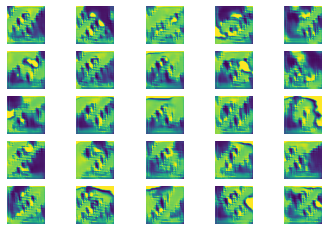

EPOCH: 27 BATCH: 1 d_loss1: 0.6166170835494995 d_loss2: 0.5701749324798584 g_loss: 1.5390808582305908
EPOCH: 27 BATCH: 2 d_loss1: 0.7010771036148071 d_loss2: 0.3783811926841736 g_loss: 1.9754014015197754
EPOCH: 27 BATCH: 3 d_loss1: 1.1332099437713623 d_loss2: 0.5021160840988159 g_loss: 1.930698037147522
EPOCH: 27 BATCH: 4 d_loss1: 0.7382717132568359 d_loss2: 0.3333645462989807 g_loss: 1.7075475454330444
EPOCH: 27 BATCH: 5 d_loss1: 0.48443275690078735 d_loss2: 0.34563446044921875 g_loss: 1.3861629962921143
EPOCH: 27 BATCH: 6 d_loss1: 0.6025749444961548 d_loss2: 0.5871536731719971 g_loss: 1.521208643913269
EPOCH: 27 BATCH: 7 d_loss1: 0.6244343519210815 d_loss2: 0.6736983060836792 g_loss: 2.1308822631835938
EPOCH: 27 BATCH: 8 d_loss1: 0.8709437847137451 d_loss2: 0.24468408524990082 g_loss: 1.8589876890182495
EPOCH: 27 BATCH: 9 d_loss1: 0.8534107208251953 d_loss2: 0.8553969264030457 g_loss: 1.9451744556427002
EPOCH: 27 BATCH: 10 d_loss1: 1.076162576675415 d_loss2: 0.6852376461029053 g_loss

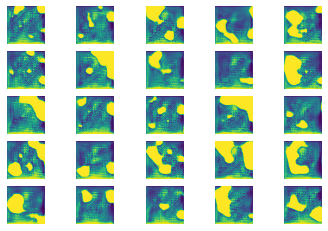

EPOCH: 28 BATCH: 1 d_loss1: 0.6929360628128052 d_loss2: 0.46469372510910034 g_loss: 0.9433192610740662
EPOCH: 28 BATCH: 2 d_loss1: 0.490724116563797 d_loss2: 0.40575310587882996 g_loss: 0.7920314073562622
EPOCH: 28 BATCH: 3 d_loss1: 0.5038840174674988 d_loss2: 0.47599345445632935 g_loss: 0.7932904958724976
EPOCH: 28 BATCH: 4 d_loss1: 0.7179028987884521 d_loss2: 0.5584381818771362 g_loss: 1.1147499084472656
EPOCH: 28 BATCH: 5 d_loss1: 0.7810544967651367 d_loss2: 0.43110179901123047 g_loss: 1.0051963329315186
EPOCH: 28 BATCH: 6 d_loss1: 0.9059377312660217 d_loss2: 0.574415385723114 g_loss: 0.6017946004867554
EPOCH: 28 BATCH: 7 d_loss1: 0.572086751461029 d_loss2: 0.7053995132446289 g_loss: 0.7266028523445129
EPOCH: 28 BATCH: 8 d_loss1: 0.8517389297485352 d_loss2: 0.6638280153274536 g_loss: 0.9366028308868408
EPOCH: 28 BATCH: 9 d_loss1: 0.7798197269439697 d_loss2: 0.9147133827209473 g_loss: 0.7333681583404541
EPOCH: 28 BATCH: 10 d_loss1: 0.734914243221283 d_loss2: 1.0387489795684814 g_loss

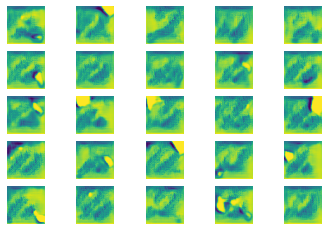

EPOCH: 29 BATCH: 1 d_loss1: 0.41164976358413696 d_loss2: 0.4513758420944214 g_loss: 0.26460886001586914
EPOCH: 29 BATCH: 2 d_loss1: 0.7810328006744385 d_loss2: 0.4576871395111084 g_loss: 0.5373216867446899
EPOCH: 29 BATCH: 3 d_loss1: 0.5537718534469604 d_loss2: 0.3629525899887085 g_loss: 1.032171607017517
EPOCH: 29 BATCH: 4 d_loss1: 0.4482395350933075 d_loss2: 0.6161191463470459 g_loss: 0.528496265411377
EPOCH: 29 BATCH: 5 d_loss1: 0.37805354595184326 d_loss2: 0.4781119227409363 g_loss: 0.21020743250846863
EPOCH: 29 BATCH: 6 d_loss1: 0.3224673569202423 d_loss2: 0.40521833300590515 g_loss: 0.36923748254776
EPOCH: 29 BATCH: 7 d_loss1: 0.7471481561660767 d_loss2: 0.5129038095474243 g_loss: 0.2920253276824951
EPOCH: 29 BATCH: 8 d_loss1: 0.6820782423019409 d_loss2: 0.5961640477180481 g_loss: 0.45041555166244507
EPOCH: 29 BATCH: 9 d_loss1: 0.609366238117218 d_loss2: 0.36582469940185547 g_loss: 0.8132944107055664
EPOCH: 29 BATCH: 10 d_loss1: 0.5782774686813354 d_loss2: 0.637274444103241 g_los

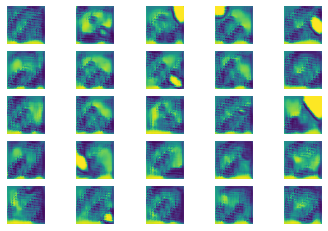

EPOCH: 30 BATCH: 1 d_loss1: 0.766344428062439 d_loss2: 0.5650528073310852 g_loss: 0.8152859210968018
EPOCH: 30 BATCH: 2 d_loss1: 0.6035889387130737 d_loss2: 0.47716376185417175 g_loss: 0.4947781562805176
EPOCH: 30 BATCH: 3 d_loss1: 0.5727066993713379 d_loss2: 0.22025664150714874 g_loss: 0.38567888736724854
EPOCH: 30 BATCH: 4 d_loss1: 0.3148646354675293 d_loss2: 0.38741570711135864 g_loss: 0.259507954120636
EPOCH: 30 BATCH: 5 d_loss1: 0.41542038321495056 d_loss2: 0.42687755823135376 g_loss: 0.76874840259552
EPOCH: 30 BATCH: 6 d_loss1: 0.44273918867111206 d_loss2: 0.3183712661266327 g_loss: 1.9204931259155273
EPOCH: 30 BATCH: 7 d_loss1: 0.3058300316333771 d_loss2: 0.4658791720867157 g_loss: 1.4820985794067383
EPOCH: 30 BATCH: 8 d_loss1: 0.39672210812568665 d_loss2: 0.43494898080825806 g_loss: 1.381996512413025
EPOCH: 30 BATCH: 9 d_loss1: 0.6540923714637756 d_loss2: 0.676476001739502 g_loss: 0.7999693155288696
EPOCH: 30 BATCH: 10 d_loss1: 0.709829568862915 d_loss2: 0.6598329544067383 g_lo

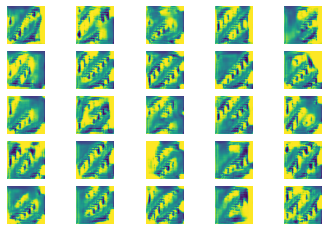

EPOCH: 31 BATCH: 1 d_loss1: 0.6706494092941284 d_loss2: 0.26933321356773376 g_loss: 1.1858012676239014
EPOCH: 31 BATCH: 2 d_loss1: 0.6797255277633667 d_loss2: 0.6972635388374329 g_loss: 2.802302837371826
EPOCH: 31 BATCH: 3 d_loss1: 0.817502498626709 d_loss2: 0.06382931768894196 g_loss: 2.6456704139709473
EPOCH: 31 BATCH: 4 d_loss1: 0.6936911940574646 d_loss2: 0.22165390849113464 g_loss: 1.4406204223632812
EPOCH: 31 BATCH: 5 d_loss1: 0.2835114598274231 d_loss2: 0.2512824535369873 g_loss: 1.0314900875091553
EPOCH: 31 BATCH: 6 d_loss1: 0.2570154070854187 d_loss2: 0.13865900039672852 g_loss: 0.48635396361351013
EPOCH: 31 BATCH: 7 d_loss1: 0.3972300887107849 d_loss2: 0.2520480155944824 g_loss: 0.3254815936088562
EPOCH: 31 BATCH: 8 d_loss1: 0.6440296173095703 d_loss2: 0.3854440450668335 g_loss: 0.2891731560230255
EPOCH: 31 BATCH: 9 d_loss1: 0.9378204345703125 d_loss2: 0.6176027059555054 g_loss: 0.277488112449646
EPOCH: 31 BATCH: 10 d_loss1: 0.6872149705886841 d_loss2: 0.5427245497703552 g_lo

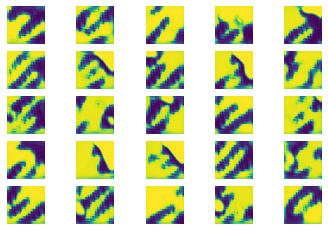

EPOCH: 32 BATCH: 1 d_loss1: 0.6302250623703003 d_loss2: 0.24651867151260376 g_loss: 1.5606282949447632
EPOCH: 32 BATCH: 2 d_loss1: 0.7157756090164185 d_loss2: 0.36893439292907715 g_loss: 1.3451871871948242
EPOCH: 32 BATCH: 3 d_loss1: 0.4884229600429535 d_loss2: 0.4302244782447815 g_loss: 1.1027071475982666
EPOCH: 32 BATCH: 4 d_loss1: 0.30602020025253296 d_loss2: 0.3456437885761261 g_loss: 1.6530685424804688
EPOCH: 32 BATCH: 5 d_loss1: 0.7349398136138916 d_loss2: 0.4957062900066376 g_loss: 1.5167829990386963
EPOCH: 32 BATCH: 6 d_loss1: 0.7228549718856812 d_loss2: 0.44544166326522827 g_loss: 1.3400797843933105
EPOCH: 32 BATCH: 7 d_loss1: 0.29175102710723877 d_loss2: 0.24426878988742828 g_loss: 1.1703073978424072
EPOCH: 32 BATCH: 8 d_loss1: 0.7378866672515869 d_loss2: 0.366930216550827 g_loss: 0.6642794609069824
EPOCH: 32 BATCH: 9 d_loss1: 0.7136409282684326 d_loss2: 0.6194157004356384 g_loss: 1.0569350719451904
EPOCH: 32 BATCH: 10 d_loss1: 0.5290122032165527 d_loss2: 0.2721993029117584 g

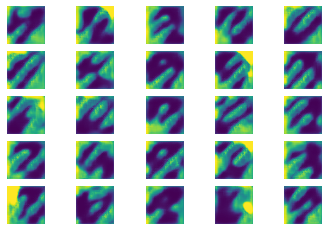

EPOCH: 33 BATCH: 1 d_loss1: 0.9178059101104736 d_loss2: 0.198530375957489 g_loss: 1.2400267124176025
EPOCH: 33 BATCH: 2 d_loss1: 0.6429970264434814 d_loss2: 0.833779513835907 g_loss: 0.9957869648933411
EPOCH: 33 BATCH: 3 d_loss1: 0.8133569359779358 d_loss2: 0.2479863166809082 g_loss: 1.3089828491210938
EPOCH: 33 BATCH: 4 d_loss1: 0.7213426232337952 d_loss2: 0.27584904432296753 g_loss: 1.3913354873657227
EPOCH: 33 BATCH: 5 d_loss1: 0.31404227018356323 d_loss2: 0.2733515501022339 g_loss: 1.1320545673370361
EPOCH: 33 BATCH: 6 d_loss1: 0.3606601357460022 d_loss2: 0.326189249753952 g_loss: 1.040299654006958
EPOCH: 33 BATCH: 7 d_loss1: 0.4727936089038849 d_loss2: 0.5217163562774658 g_loss: 0.650114893913269
EPOCH: 33 BATCH: 8 d_loss1: 0.45160529017448425 d_loss2: 0.6657087802886963 g_loss: 0.8954834938049316
EPOCH: 33 BATCH: 9 d_loss1: 0.7409084439277649 d_loss2: 0.3636898100376129 g_loss: 0.865794837474823
EPOCH: 33 BATCH: 10 d_loss1: 0.4675421416759491 d_loss2: 0.1445755660533905 g_loss: 0

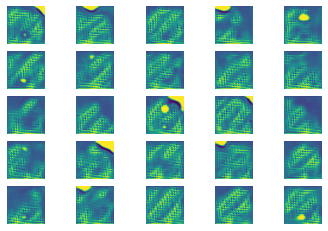

EPOCH: 34 BATCH: 1 d_loss1: 0.5088182687759399 d_loss2: 0.3106372356414795 g_loss: 0.21845725178718567
EPOCH: 34 BATCH: 2 d_loss1: 0.300022691488266 d_loss2: 0.33422067761421204 g_loss: 0.3778344988822937
EPOCH: 34 BATCH: 3 d_loss1: 0.4233522415161133 d_loss2: 0.3576444983482361 g_loss: 0.9313737750053406
EPOCH: 34 BATCH: 4 d_loss1: 0.6346931457519531 d_loss2: 0.4438234865665436 g_loss: 1.3321959972381592
EPOCH: 34 BATCH: 5 d_loss1: 0.5648742318153381 d_loss2: 0.3256623148918152 g_loss: 1.267778992652893
EPOCH: 34 BATCH: 6 d_loss1: 0.7309340834617615 d_loss2: 0.6301225423812866 g_loss: 1.958977222442627
EPOCH: 34 BATCH: 7 d_loss1: 0.6367788314819336 d_loss2: 0.24273759126663208 g_loss: 2.214616298675537
EPOCH: 34 BATCH: 8 d_loss1: 0.6123951077461243 d_loss2: 0.4548368453979492 g_loss: 1.924574613571167
EPOCH: 34 BATCH: 9 d_loss1: 0.4481644332408905 d_loss2: 0.8604143857955933 g_loss: 3.140425205230713
EPOCH: 34 BATCH: 10 d_loss1: 0.983130931854248 d_loss2: 0.1422976553440094 g_loss: 1.

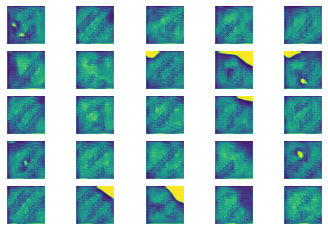

EPOCH: 35 BATCH: 1 d_loss1: 0.46907663345336914 d_loss2: 0.3753943145275116 g_loss: 0.6594642400741577
EPOCH: 35 BATCH: 2 d_loss1: 0.43146681785583496 d_loss2: 0.5467281341552734 g_loss: 1.0643784999847412
EPOCH: 35 BATCH: 3 d_loss1: 0.621513307094574 d_loss2: 0.36418789625167847 g_loss: 1.0292189121246338
EPOCH: 35 BATCH: 4 d_loss1: 0.8963961005210876 d_loss2: 0.5664619207382202 g_loss: 0.8895255327224731
EPOCH: 35 BATCH: 5 d_loss1: 0.6616600751876831 d_loss2: 0.5115605592727661 g_loss: 1.29232919216156
EPOCH: 35 BATCH: 6 d_loss1: 0.5742771625518799 d_loss2: 0.3698195517063141 g_loss: 1.69173002243042
EPOCH: 35 BATCH: 7 d_loss1: 0.5520924925804138 d_loss2: 0.4002111852169037 g_loss: 1.7719857692718506
EPOCH: 35 BATCH: 8 d_loss1: 0.35131996870040894 d_loss2: 0.33459246158599854 g_loss: 1.9342200756072998
EPOCH: 35 BATCH: 9 d_loss1: 0.31057173013687134 d_loss2: 0.3380991220474243 g_loss: 2.27105450630188
EPOCH: 35 BATCH: 10 d_loss1: 0.3123941123485565 d_loss2: 0.2424548715353012 g_loss:

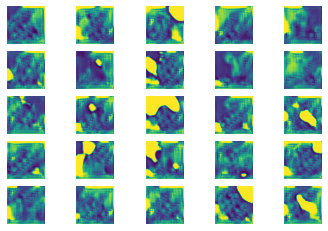

EPOCH: 36 BATCH: 1 d_loss1: 0.7257602214813232 d_loss2: 0.6219993233680725 g_loss: 0.9955788850784302
EPOCH: 36 BATCH: 2 d_loss1: 0.22306421399116516 d_loss2: 0.6180509924888611 g_loss: 1.3454023599624634
EPOCH: 36 BATCH: 3 d_loss1: 0.7707414627075195 d_loss2: 0.7765898704528809 g_loss: 0.7637969255447388
EPOCH: 36 BATCH: 4 d_loss1: 0.5677503347396851 d_loss2: 0.7426187992095947 g_loss: 0.6578307151794434
EPOCH: 36 BATCH: 5 d_loss1: 0.6531137824058533 d_loss2: 0.7339437007904053 g_loss: 0.49739956855773926
EPOCH: 36 BATCH: 6 d_loss1: 0.7390574812889099 d_loss2: 0.7719442248344421 g_loss: 0.7866660356521606
EPOCH: 36 BATCH: 7 d_loss1: 0.7037703394889832 d_loss2: 0.6928744316101074 g_loss: 0.35689184069633484
EPOCH: 36 BATCH: 8 d_loss1: 0.5238050222396851 d_loss2: 0.5625154972076416 g_loss: 0.51816326379776
EPOCH: 36 BATCH: 9 d_loss1: 0.5591503381729126 d_loss2: 0.5501724481582642 g_loss: 0.6520333290100098
EPOCH: 36 BATCH: 10 d_loss1: 0.4244946539402008 d_loss2: 0.4379979968070984 g_los

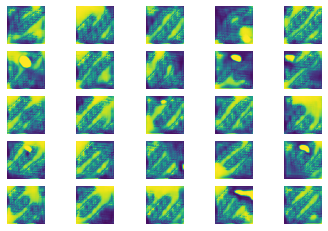

EPOCH: 37 BATCH: 1 d_loss1: 0.8329835534095764 d_loss2: 0.5018004179000854 g_loss: 1.5030838251113892
EPOCH: 37 BATCH: 2 d_loss1: 0.5549581050872803 d_loss2: 0.5919110774993896 g_loss: 1.2419860363006592
EPOCH: 37 BATCH: 3 d_loss1: 0.9807109236717224 d_loss2: 1.2052425146102905 g_loss: 1.0741304159164429
EPOCH: 37 BATCH: 4 d_loss1: 0.8218066692352295 d_loss2: 0.5144178867340088 g_loss: 2.153571128845215
EPOCH: 37 BATCH: 5 d_loss1: 0.6741050481796265 d_loss2: 0.35203611850738525 g_loss: 1.2268972396850586
EPOCH: 37 BATCH: 6 d_loss1: 0.5008276700973511 d_loss2: 0.6406389474868774 g_loss: 1.569053292274475
EPOCH: 37 BATCH: 7 d_loss1: 0.6416382789611816 d_loss2: 0.2431134283542633 g_loss: 1.1800553798675537
EPOCH: 37 BATCH: 8 d_loss1: 0.4128357172012329 d_loss2: 0.2570103108882904 g_loss: 1.1165308952331543
EPOCH: 37 BATCH: 9 d_loss1: 0.2604064345359802 d_loss2: 0.20601996779441833 g_loss: 1.382245421409607
EPOCH: 37 BATCH: 10 d_loss1: 0.3278964161872864 d_loss2: 0.20458954572677612 g_loss

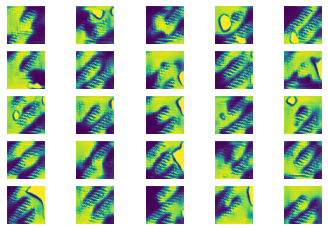

EPOCH: 38 BATCH: 1 d_loss1: 0.5641778707504272 d_loss2: 0.5253682136535645 g_loss: 0.8469755053520203
EPOCH: 38 BATCH: 2 d_loss1: 0.3403957486152649 d_loss2: 0.5383620858192444 g_loss: 0.9617804288864136
EPOCH: 38 BATCH: 3 d_loss1: 0.5755205154418945 d_loss2: 0.9361275434494019 g_loss: 1.3724654912948608
EPOCH: 38 BATCH: 4 d_loss1: 0.5673378705978394 d_loss2: 0.3676202893257141 g_loss: 2.9368715286254883
EPOCH: 38 BATCH: 5 d_loss1: 0.9190171360969543 d_loss2: 0.20235614478588104 g_loss: 1.1536016464233398
EPOCH: 38 BATCH: 6 d_loss1: 0.7232120633125305 d_loss2: 1.11043119430542 g_loss: 2.030533790588379
EPOCH: 38 BATCH: 7 d_loss1: 0.8215121030807495 d_loss2: 0.18517963588237762 g_loss: 1.7581167221069336
EPOCH: 38 BATCH: 8 d_loss1: 0.6128242015838623 d_loss2: 0.574639081954956 g_loss: 1.3766056299209595
EPOCH: 38 BATCH: 9 d_loss1: 0.4688604772090912 d_loss2: 0.46791934967041016 g_loss: 1.3700075149536133
EPOCH: 38 BATCH: 10 d_loss1: 0.6191284656524658 d_loss2: 0.47733837366104126 g_loss

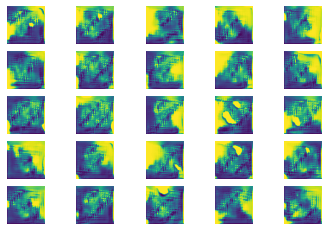

EPOCH: 39 BATCH: 1 d_loss1: 0.5276552438735962 d_loss2: 0.35898637771606445 g_loss: 1.0664597749710083
EPOCH: 39 BATCH: 2 d_loss1: 0.4957755506038666 d_loss2: 0.5388445854187012 g_loss: 1.291250467300415
EPOCH: 39 BATCH: 3 d_loss1: 0.6565235257148743 d_loss2: 0.607122540473938 g_loss: 1.571016550064087
EPOCH: 39 BATCH: 4 d_loss1: 0.8149758577346802 d_loss2: 0.6852390766143799 g_loss: 2.113968849182129
EPOCH: 39 BATCH: 5 d_loss1: 0.7900211811065674 d_loss2: 0.3402922749519348 g_loss: 2.6614997386932373
EPOCH: 39 BATCH: 6 d_loss1: 0.7879351377487183 d_loss2: 0.25032901763916016 g_loss: 1.6685374975204468
EPOCH: 39 BATCH: 7 d_loss1: 0.48735499382019043 d_loss2: 0.3502280116081238 g_loss: 1.0853173732757568
EPOCH: 39 BATCH: 8 d_loss1: 0.3568706512451172 d_loss2: 0.32184073328971863 g_loss: 1.144601583480835
EPOCH: 39 BATCH: 9 d_loss1: 0.6516249775886536 d_loss2: 0.23883990943431854 g_loss: 0.8155218362808228
EPOCH: 39 BATCH: 10 d_loss1: 0.4384683668613434 d_loss2: 0.4739367365837097 g_loss

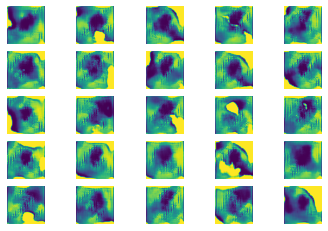

EPOCH: 40 BATCH: 1 d_loss1: 0.6073797345161438 d_loss2: 0.32106274366378784 g_loss: 1.9890737533569336
EPOCH: 40 BATCH: 2 d_loss1: 0.7351177930831909 d_loss2: 0.6526070833206177 g_loss: 1.3948122262954712
EPOCH: 40 BATCH: 3 d_loss1: 0.5321535468101501 d_loss2: 0.29919546842575073 g_loss: 1.1118638515472412
EPOCH: 40 BATCH: 4 d_loss1: 0.5580261945724487 d_loss2: 0.3004211485385895 g_loss: 1.1212973594665527
EPOCH: 40 BATCH: 5 d_loss1: 0.5173063278198242 d_loss2: 0.3803490996360779 g_loss: 0.8573104739189148
EPOCH: 40 BATCH: 6 d_loss1: 0.8457858562469482 d_loss2: 0.34186047315597534 g_loss: 0.5171105861663818
EPOCH: 40 BATCH: 7 d_loss1: 0.5865440368652344 d_loss2: 0.5068869590759277 g_loss: 1.0980194807052612
EPOCH: 40 BATCH: 8 d_loss1: 0.3441937565803528 d_loss2: 0.3982357382774353 g_loss: 0.7287444472312927
EPOCH: 40 BATCH: 9 d_loss1: 0.6962069869041443 d_loss2: 0.33345508575439453 g_loss: 0.8770551085472107
EPOCH: 40 BATCH: 10 d_loss1: 0.3658633828163147 d_loss2: 0.27846160531044006 g

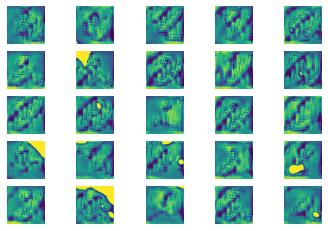

EPOCH: 41 BATCH: 1 d_loss1: 0.47680532932281494 d_loss2: 0.3459475338459015 g_loss: 2.002436637878418
EPOCH: 41 BATCH: 2 d_loss1: 0.41285982728004456 d_loss2: 0.32390084862709045 g_loss: 1.7197530269622803
EPOCH: 41 BATCH: 3 d_loss1: 0.730384349822998 d_loss2: 0.8136522769927979 g_loss: 0.9241949319839478
EPOCH: 41 BATCH: 4 d_loss1: 0.49563732743263245 d_loss2: 0.5641770958900452 g_loss: 1.5665851831436157
EPOCH: 41 BATCH: 5 d_loss1: 0.6225407719612122 d_loss2: 0.6199581623077393 g_loss: 1.5107126235961914
EPOCH: 41 BATCH: 6 d_loss1: 0.5140179395675659 d_loss2: 0.6163806915283203 g_loss: 1.4034103155136108
EPOCH: 41 BATCH: 7 d_loss1: 0.5653799772262573 d_loss2: 0.6355623602867126 g_loss: 0.8860346078872681
EPOCH: 41 BATCH: 8 d_loss1: 0.7304602861404419 d_loss2: 0.7627424001693726 g_loss: 0.552120566368103
EPOCH: 41 BATCH: 9 d_loss1: 0.6692562699317932 d_loss2: 0.5286704897880554 g_loss: 0.6834546327590942
EPOCH: 41 BATCH: 10 d_loss1: 0.606698751449585 d_loss2: 0.4951532483100891 g_loss

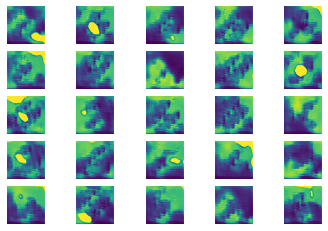

EPOCH: 42 BATCH: 1 d_loss1: 0.4548192620277405 d_loss2: 0.43798232078552246 g_loss: 0.5471903085708618
EPOCH: 42 BATCH: 2 d_loss1: 0.7708783149719238 d_loss2: 0.4115034341812134 g_loss: 0.7171444892883301
EPOCH: 42 BATCH: 3 d_loss1: 0.5204042196273804 d_loss2: 0.5652807950973511 g_loss: 0.618522047996521
EPOCH: 42 BATCH: 4 d_loss1: 0.6783870458602905 d_loss2: 0.3234044909477234 g_loss: 1.4120724201202393
EPOCH: 42 BATCH: 5 d_loss1: 0.887452244758606 d_loss2: 0.3875401020050049 g_loss: 0.1862950176000595
EPOCH: 42 BATCH: 6 d_loss1: 0.41834455728530884 d_loss2: 0.5501161813735962 g_loss: 0.5402082800865173
EPOCH: 42 BATCH: 7 d_loss1: 0.5472210645675659 d_loss2: 0.37701416015625 g_loss: 0.4785167872905731
EPOCH: 42 BATCH: 8 d_loss1: 0.6441347002983093 d_loss2: 0.4583706855773926 g_loss: 0.41125181317329407
EPOCH: 42 BATCH: 9 d_loss1: 0.6356359720230103 d_loss2: 0.3730548024177551 g_loss: 0.2523464262485504
EPOCH: 42 BATCH: 10 d_loss1: 0.6922289729118347 d_loss2: 0.3734437823295593 g_loss:

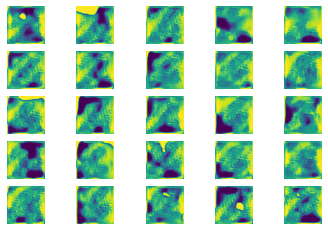

EPOCH: 43 BATCH: 1 d_loss1: 0.5802111625671387 d_loss2: 0.5736063718795776 g_loss: 1.500104308128357
EPOCH: 43 BATCH: 2 d_loss1: 0.42613762617111206 d_loss2: 0.4769822955131531 g_loss: 1.6502009630203247
EPOCH: 43 BATCH: 3 d_loss1: 0.7718251943588257 d_loss2: 0.6040548086166382 g_loss: 1.9970574378967285
EPOCH: 43 BATCH: 4 d_loss1: 0.7340075969696045 d_loss2: 0.3499293923377991 g_loss: 3.1088414192199707
EPOCH: 43 BATCH: 5 d_loss1: 0.6700631380081177 d_loss2: 0.10973413288593292 g_loss: 3.6336257457733154
EPOCH: 43 BATCH: 6 d_loss1: 1.0297504663467407 d_loss2: 0.7150882482528687 g_loss: 3.929487705230713
EPOCH: 43 BATCH: 7 d_loss1: 1.5043795108795166 d_loss2: 0.10999005287885666 g_loss: 1.979230523109436
EPOCH: 43 BATCH: 8 d_loss1: 0.79364013671875 d_loss2: 0.985663115978241 g_loss: 2.224933385848999
EPOCH: 43 BATCH: 9 d_loss1: 0.776957094669342 d_loss2: 0.0074167209677398205 g_loss: 0.3423936367034912
EPOCH: 43 BATCH: 10 d_loss1: 0.7867161631584167 d_loss2: 0.16184434294700623 g_loss:

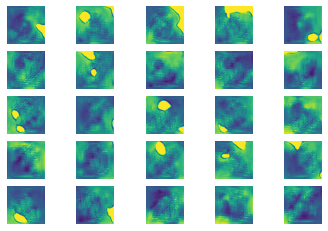

EPOCH: 44 BATCH: 1 d_loss1: 0.4434852600097656 d_loss2: 0.406585693359375 g_loss: 1.4264826774597168
EPOCH: 44 BATCH: 2 d_loss1: 0.5400298833847046 d_loss2: 0.3400079607963562 g_loss: 1.4431862831115723
EPOCH: 44 BATCH: 3 d_loss1: 0.44283291697502136 d_loss2: 0.3606789708137512 g_loss: 1.5120973587036133
EPOCH: 44 BATCH: 4 d_loss1: 0.2536524534225464 d_loss2: 0.3627398610115051 g_loss: 1.3891780376434326
EPOCH: 44 BATCH: 5 d_loss1: 0.21129213273525238 d_loss2: 0.33801698684692383 g_loss: 1.491410255432129
EPOCH: 44 BATCH: 6 d_loss1: 0.35291290283203125 d_loss2: 0.38183945417404175 g_loss: 1.28117835521698
EPOCH: 44 BATCH: 7 d_loss1: 0.4301460385322571 d_loss2: 0.6731082201004028 g_loss: 1.316428780555725
EPOCH: 44 BATCH: 8 d_loss1: 0.8214385509490967 d_loss2: 0.3306453824043274 g_loss: 0.5446135997772217
EPOCH: 44 BATCH: 9 d_loss1: 0.7974640130996704 d_loss2: 0.4102717339992523 g_loss: 0.5109822750091553
EPOCH: 44 BATCH: 10 d_loss1: 0.6039130687713623 d_loss2: 0.5140241384506226 g_loss

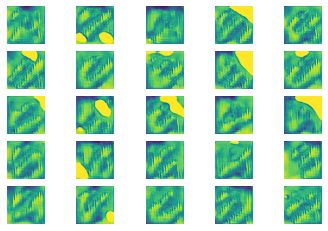

EPOCH: 45 BATCH: 1 d_loss1: 0.9149826765060425 d_loss2: 0.5464102029800415 g_loss: 1.2083492279052734
EPOCH: 45 BATCH: 2 d_loss1: 0.5683280229568481 d_loss2: 0.3344300091266632 g_loss: 1.8051598072052002
EPOCH: 45 BATCH: 3 d_loss1: 0.470664381980896 d_loss2: 0.32487592101097107 g_loss: 1.5012645721435547
EPOCH: 45 BATCH: 4 d_loss1: 0.6926325559616089 d_loss2: 0.9658617973327637 g_loss: 1.2090362310409546
EPOCH: 45 BATCH: 5 d_loss1: 0.6808776259422302 d_loss2: 0.6245172619819641 g_loss: 1.8836917877197266
EPOCH: 45 BATCH: 6 d_loss1: 0.8682688474655151 d_loss2: 0.27578967809677124 g_loss: 2.0840299129486084
EPOCH: 45 BATCH: 7 d_loss1: 0.9279253482818604 d_loss2: 0.38579779863357544 g_loss: 1.9487717151641846
EPOCH: 45 BATCH: 8 d_loss1: 0.6371510028839111 d_loss2: 0.36708739399909973 g_loss: 1.8355419635772705
EPOCH: 45 BATCH: 9 d_loss1: 0.6696468591690063 d_loss2: 0.34717363119125366 g_loss: 2.12099289894104
EPOCH: 45 BATCH: 10 d_loss1: 0.3283903896808624 d_loss2: 0.1749473512172699 g_lo

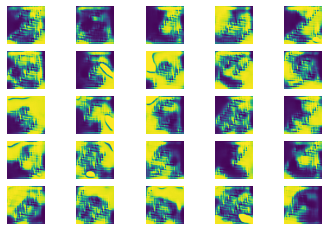

EPOCH: 46 BATCH: 1 d_loss1: 0.5142069458961487 d_loss2: 0.46739500761032104 g_loss: 0.9479730129241943
EPOCH: 46 BATCH: 2 d_loss1: 0.6053482294082642 d_loss2: 0.39579418301582336 g_loss: 1.535715937614441
EPOCH: 46 BATCH: 3 d_loss1: 0.5485235452651978 d_loss2: 0.2758077383041382 g_loss: 1.8919758796691895
EPOCH: 46 BATCH: 4 d_loss1: 0.610721230506897 d_loss2: 0.3019941747188568 g_loss: 3.271735668182373
EPOCH: 46 BATCH: 5 d_loss1: 0.7224166393280029 d_loss2: 0.9081825017929077 g_loss: 5.063472270965576
EPOCH: 46 BATCH: 6 d_loss1: 1.1556763648986816 d_loss2: 0.41080591082572937 g_loss: 3.7965750694274902
EPOCH: 46 BATCH: 7 d_loss1: 0.5944651365280151 d_loss2: 0.25783175230026245 g_loss: 2.0694775581359863
EPOCH: 46 BATCH: 8 d_loss1: 1.5796114206314087 d_loss2: 1.270005702972412 g_loss: 1.9455652236938477
EPOCH: 46 BATCH: 9 d_loss1: 0.8749499917030334 d_loss2: 0.07376203685998917 g_loss: 0.5819134712219238
EPOCH: 46 BATCH: 10 d_loss1: 0.26033303141593933 d_loss2: 0.4397261142730713 g_los

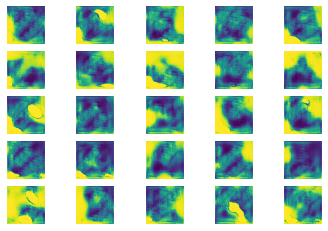

EPOCH: 47 BATCH: 1 d_loss1: 0.6679867506027222 d_loss2: 0.44290098547935486 g_loss: 1.4202876091003418
EPOCH: 47 BATCH: 2 d_loss1: 0.8518170118331909 d_loss2: 0.40482428669929504 g_loss: 0.8304195404052734
EPOCH: 47 BATCH: 3 d_loss1: 0.5558648109436035 d_loss2: 0.3283423185348511 g_loss: 1.2148356437683105
EPOCH: 47 BATCH: 4 d_loss1: 0.5770845413208008 d_loss2: 0.4080095887184143 g_loss: 0.7805396914482117
EPOCH: 47 BATCH: 5 d_loss1: 0.6274363994598389 d_loss2: 0.44295406341552734 g_loss: 0.8759437203407288
EPOCH: 47 BATCH: 6 d_loss1: 0.5858250856399536 d_loss2: 0.4855608642101288 g_loss: 1.0192430019378662
EPOCH: 47 BATCH: 7 d_loss1: 0.3112543821334839 d_loss2: 0.5374568104743958 g_loss: 1.1050972938537598
EPOCH: 47 BATCH: 8 d_loss1: 0.6673170328140259 d_loss2: 0.5180892944335938 g_loss: 1.2347652912139893
EPOCH: 47 BATCH: 9 d_loss1: 0.37125343084335327 d_loss2: 0.44663047790527344 g_loss: 1.340937852859497
EPOCH: 47 BATCH: 10 d_loss1: 0.4667324721813202 d_loss2: 0.3644407391548157 g_

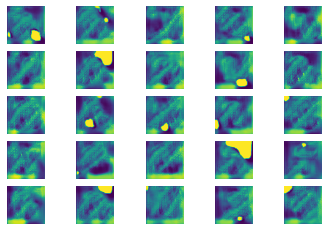

EPOCH: 48 BATCH: 1 d_loss1: 0.5491064190864563 d_loss2: 0.33743470907211304 g_loss: 0.3004530072212219
EPOCH: 48 BATCH: 2 d_loss1: 0.4020928144454956 d_loss2: 0.5440896153450012 g_loss: 0.5168629884719849
EPOCH: 48 BATCH: 3 d_loss1: 0.7443116307258606 d_loss2: 0.4333253502845764 g_loss: 0.32765692472457886
EPOCH: 48 BATCH: 4 d_loss1: 0.5928226709365845 d_loss2: 0.5441332459449768 g_loss: 0.34305858612060547
EPOCH: 48 BATCH: 5 d_loss1: 0.436498761177063 d_loss2: 0.5218149423599243 g_loss: 0.8397712707519531
EPOCH: 48 BATCH: 6 d_loss1: 0.49456584453582764 d_loss2: 0.4370652735233307 g_loss: 1.2129955291748047
EPOCH: 48 BATCH: 7 d_loss1: 0.7908610105514526 d_loss2: 0.9066886305809021 g_loss: 1.8321561813354492
EPOCH: 48 BATCH: 8 d_loss1: 0.566145658493042 d_loss2: 0.4428859353065491 g_loss: 2.101729393005371
EPOCH: 48 BATCH: 9 d_loss1: 0.6093726754188538 d_loss2: 0.4039391279220581 g_loss: 1.953434944152832
EPOCH: 48 BATCH: 10 d_loss1: 0.5972802639007568 d_loss2: 0.5114555954933167 g_loss

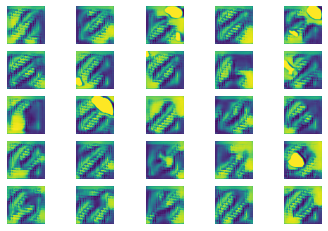

EPOCH: 49 BATCH: 1 d_loss1: 0.5177639722824097 d_loss2: 0.26089292764663696 g_loss: 1.385652780532837
EPOCH: 49 BATCH: 2 d_loss1: 0.461544394493103 d_loss2: 0.4980933964252472 g_loss: 1.6138725280761719
EPOCH: 49 BATCH: 3 d_loss1: 0.6728639602661133 d_loss2: 0.4959163963794708 g_loss: 2.4124083518981934
EPOCH: 49 BATCH: 4 d_loss1: 0.832666277885437 d_loss2: 0.4675779342651367 g_loss: 1.6241521835327148
EPOCH: 49 BATCH: 5 d_loss1: 0.9494192600250244 d_loss2: 1.0254290103912354 g_loss: 2.3360257148742676
EPOCH: 49 BATCH: 6 d_loss1: 0.46019402146339417 d_loss2: 0.1795741766691208 g_loss: 2.6004419326782227
EPOCH: 49 BATCH: 7 d_loss1: 1.2296260595321655 d_loss2: 0.8201580047607422 g_loss: 2.9967026710510254
EPOCH: 49 BATCH: 8 d_loss1: 0.8212493658065796 d_loss2: 0.09320548921823502 g_loss: 1.7671656608581543
EPOCH: 49 BATCH: 9 d_loss1: 0.8000403642654419 d_loss2: 0.5223177075386047 g_loss: 1.1405277252197266
EPOCH: 49 BATCH: 10 d_loss1: 0.3787159025669098 d_loss2: 0.5191359519958496 g_loss

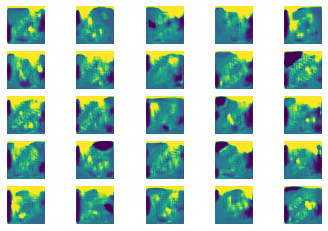

EPOCH: 50 BATCH: 1 d_loss1: 0.9118533134460449 d_loss2: 0.3874662518501282 g_loss: 1.2310898303985596
EPOCH: 50 BATCH: 2 d_loss1: 0.9582197070121765 d_loss2: 0.22870157659053802 g_loss: 1.7696212530136108
EPOCH: 50 BATCH: 3 d_loss1: 0.6484174728393555 d_loss2: 0.27380800247192383 g_loss: 1.2965264320373535
EPOCH: 50 BATCH: 4 d_loss1: 0.2501572370529175 d_loss2: 0.33990827202796936 g_loss: 1.5929036140441895
EPOCH: 50 BATCH: 5 d_loss1: 0.5745251178741455 d_loss2: 0.3343876302242279 g_loss: 1.7501482963562012
EPOCH: 50 BATCH: 6 d_loss1: 0.2306438386440277 d_loss2: 0.5879168510437012 g_loss: 1.5590890645980835
EPOCH: 50 BATCH: 7 d_loss1: 0.14027339220046997 d_loss2: 0.20105193555355072 g_loss: 2.1430721282958984
EPOCH: 50 BATCH: 8 d_loss1: 0.1240110769867897 d_loss2: 0.350063294172287 g_loss: 2.2495474815368652
EPOCH: 50 BATCH: 9 d_loss1: 0.29954707622528076 d_loss2: 0.2122163325548172 g_loss: 1.5665172338485718
EPOCH: 50 BATCH: 10 d_loss1: 0.43989992141723633 d_loss2: 0.38794854283332825

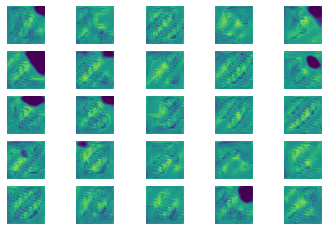

EPOCH: 51 BATCH: 1 d_loss1: 0.2884901165962219 d_loss2: 0.3656157851219177 g_loss: 0.26996174454689026
EPOCH: 51 BATCH: 2 d_loss1: 0.609276294708252 d_loss2: 0.38277125358581543 g_loss: 0.4133358597755432
EPOCH: 51 BATCH: 3 d_loss1: 0.7469810247421265 d_loss2: 0.32855772972106934 g_loss: 0.5532501339912415
EPOCH: 51 BATCH: 4 d_loss1: 0.22486069798469543 d_loss2: 0.50249183177948 g_loss: 0.7564717531204224
EPOCH: 51 BATCH: 5 d_loss1: 0.31801486015319824 d_loss2: 0.2934443950653076 g_loss: 0.5621544122695923
EPOCH: 51 BATCH: 6 d_loss1: 0.5975732803344727 d_loss2: 0.513485312461853 g_loss: 0.7806081175804138
EPOCH: 51 BATCH: 7 d_loss1: 0.26917198300361633 d_loss2: 0.5048370957374573 g_loss: 0.8913943767547607
EPOCH: 51 BATCH: 8 d_loss1: 0.4210933446884155 d_loss2: 0.3633543848991394 g_loss: 0.5313657522201538
EPOCH: 51 BATCH: 9 d_loss1: 0.430752158164978 d_loss2: 0.5089445114135742 g_loss: 0.679429292678833
EPOCH: 51 BATCH: 10 d_loss1: 0.3724879026412964 d_loss2: 0.30333590507507324 g_los

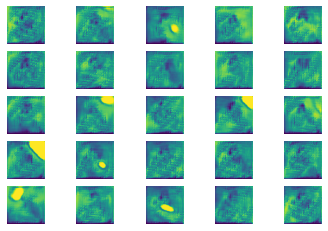

EPOCH: 52 BATCH: 1 d_loss1: 0.3686215579509735 d_loss2: 0.2494613528251648 g_loss: 0.7886070013046265
EPOCH: 52 BATCH: 2 d_loss1: 0.4158862829208374 d_loss2: 0.2223539799451828 g_loss: 0.7813931703567505
EPOCH: 52 BATCH: 3 d_loss1: 0.34829384088516235 d_loss2: 0.2620977759361267 g_loss: 0.9669550657272339
EPOCH: 52 BATCH: 4 d_loss1: 0.4057610332965851 d_loss2: 0.3056145906448364 g_loss: 1.2206876277923584
EPOCH: 52 BATCH: 5 d_loss1: 0.2669369578361511 d_loss2: 0.18474411964416504 g_loss: 1.705258846282959
EPOCH: 52 BATCH: 6 d_loss1: 0.4893888831138611 d_loss2: 0.24009832739830017 g_loss: 1.579858422279358
EPOCH: 52 BATCH: 7 d_loss1: 0.23492169380187988 d_loss2: 0.1675194799900055 g_loss: 1.9605603218078613
EPOCH: 52 BATCH: 8 d_loss1: 0.2788181006908417 d_loss2: 0.17688965797424316 g_loss: 2.1336400508880615
EPOCH: 52 BATCH: 9 d_loss1: 0.23199144005775452 d_loss2: 0.21358205378055573 g_loss: 2.1401805877685547
EPOCH: 52 BATCH: 10 d_loss1: 0.4801379442214966 d_loss2: 0.5187880992889404 g

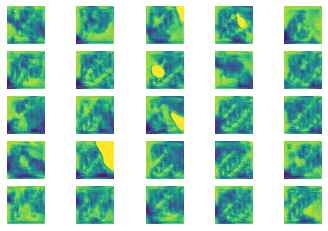

EPOCH: 53 BATCH: 1 d_loss1: 0.6241970062255859 d_loss2: 0.4557957053184509 g_loss: 0.5123292803764343
EPOCH: 53 BATCH: 2 d_loss1: 1.040121078491211 d_loss2: 0.45771461725234985 g_loss: 0.4705216586589813
EPOCH: 53 BATCH: 3 d_loss1: 0.40812093019485474 d_loss2: 0.5064864158630371 g_loss: 0.6005651354789734
EPOCH: 53 BATCH: 4 d_loss1: 0.41284602880477905 d_loss2: 0.3838840126991272 g_loss: 1.22213613986969
EPOCH: 53 BATCH: 5 d_loss1: 0.8497679233551025 d_loss2: 0.46835267543792725 g_loss: 0.9414098262786865
EPOCH: 53 BATCH: 6 d_loss1: 0.5039947032928467 d_loss2: 0.3979649543762207 g_loss: 1.3098551034927368
EPOCH: 53 BATCH: 7 d_loss1: 0.5485912561416626 d_loss2: 0.2960023581981659 g_loss: 1.5728389024734497
EPOCH: 53 BATCH: 8 d_loss1: 0.2900347113609314 d_loss2: 0.30092090368270874 g_loss: 1.7413440942764282
EPOCH: 53 BATCH: 9 d_loss1: 0.4050258994102478 d_loss2: 0.26855671405792236 g_loss: 1.7219384908676147
EPOCH: 53 BATCH: 10 d_loss1: 0.36493074893951416 d_loss2: 0.29872000217437744 g

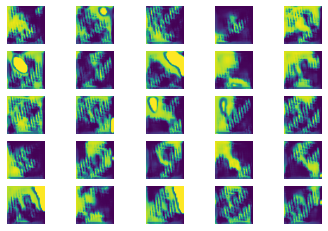

EPOCH: 54 BATCH: 1 d_loss1: 0.8834325075149536 d_loss2: 0.4772701859474182 g_loss: 3.056960105895996
EPOCH: 54 BATCH: 2 d_loss1: 0.5258278250694275 d_loss2: 0.28344428539276123 g_loss: 2.4289135932922363
EPOCH: 54 BATCH: 3 d_loss1: 0.6916760206222534 d_loss2: 0.4087480902671814 g_loss: 2.446404457092285
EPOCH: 54 BATCH: 4 d_loss1: 1.1500229835510254 d_loss2: 0.7324444651603699 g_loss: 0.6942176222801208
EPOCH: 54 BATCH: 5 d_loss1: 0.4730056822299957 d_loss2: 0.310722291469574 g_loss: 1.1291439533233643
EPOCH: 54 BATCH: 6 d_loss1: 1.61658775806427 d_loss2: 0.5047785043716431 g_loss: 1.4071283340454102
EPOCH: 54 BATCH: 7 d_loss1: 0.4666628837585449 d_loss2: 0.3050297498703003 g_loss: 2.024935483932495
EPOCH: 54 BATCH: 8 d_loss1: 0.5529974699020386 d_loss2: 0.36010611057281494 g_loss: 1.5066428184509277
EPOCH: 54 BATCH: 9 d_loss1: 0.38872915506362915 d_loss2: 0.27665892243385315 g_loss: 1.4457411766052246
EPOCH: 54 BATCH: 10 d_loss1: 0.4289276599884033 d_loss2: 0.38024020195007324 g_loss:

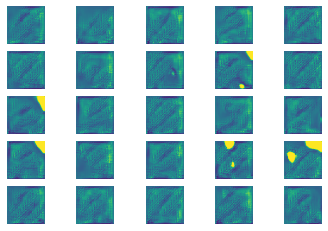

EPOCH: 55 BATCH: 1 d_loss1: 0.2705785036087036 d_loss2: 0.6080582141876221 g_loss: 1.775676965713501
EPOCH: 55 BATCH: 2 d_loss1: 1.249333381652832 d_loss2: 1.2292075157165527 g_loss: 1.2826037406921387
EPOCH: 55 BATCH: 3 d_loss1: 0.7216295003890991 d_loss2: 0.45215123891830444 g_loss: 0.7396721839904785
EPOCH: 55 BATCH: 4 d_loss1: 0.9025977253913879 d_loss2: 0.47038280963897705 g_loss: 0.7495017051696777
EPOCH: 55 BATCH: 5 d_loss1: 0.34647083282470703 d_loss2: 0.5218241214752197 g_loss: 0.7375276684761047
EPOCH: 55 BATCH: 6 d_loss1: 0.34480923414230347 d_loss2: 0.33429908752441406 g_loss: 1.0477477312088013
EPOCH: 55 BATCH: 7 d_loss1: 0.4648110270500183 d_loss2: 0.3683024048805237 g_loss: 0.8027239441871643
EPOCH: 55 BATCH: 8 d_loss1: 0.5176832675933838 d_loss2: 0.23821687698364258 g_loss: 2.3325977325439453
EPOCH: 55 BATCH: 9 d_loss1: 0.5136195421218872 d_loss2: 0.49262040853500366 g_loss: 1.597338318824768
EPOCH: 55 BATCH: 10 d_loss1: 0.39297834038734436 d_loss2: 0.6775530576705933 g

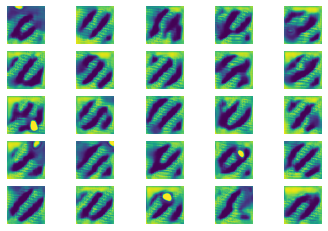

EPOCH: 56 BATCH: 1 d_loss1: 0.8143123388290405 d_loss2: 0.2966456413269043 g_loss: 0.29970747232437134
EPOCH: 56 BATCH: 2 d_loss1: 0.38491588830947876 d_loss2: 0.21764922142028809 g_loss: 0.47690075635910034
EPOCH: 56 BATCH: 3 d_loss1: 0.5003811717033386 d_loss2: 0.2061873823404312 g_loss: 0.5833392143249512
EPOCH: 56 BATCH: 4 d_loss1: 0.15420149266719818 d_loss2: 0.0791766569018364 g_loss: 0.7754172682762146
EPOCH: 56 BATCH: 5 d_loss1: 0.3920744061470032 d_loss2: 0.14614565670490265 g_loss: 0.6233519315719604
EPOCH: 56 BATCH: 6 d_loss1: 0.41579338908195496 d_loss2: 0.18787646293640137 g_loss: 0.601487934589386
EPOCH: 56 BATCH: 7 d_loss1: 0.24994222819805145 d_loss2: 0.09652179479598999 g_loss: 0.5278834104537964
EPOCH: 56 BATCH: 8 d_loss1: 0.249039888381958 d_loss2: 0.26927852630615234 g_loss: 0.5922780632972717
EPOCH: 56 BATCH: 9 d_loss1: 0.5733829736709595 d_loss2: 0.3743348717689514 g_loss: 0.875444769859314
EPOCH: 56 BATCH: 10 d_loss1: 0.8301492929458618 d_loss2: 0.502516627311706

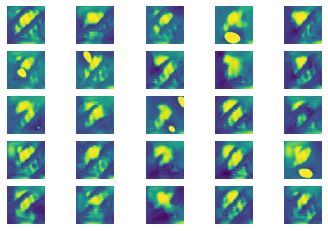

EPOCH: 57 BATCH: 1 d_loss1: 0.42569500207901 d_loss2: 0.18692095577716827 g_loss: 2.1236002445220947
EPOCH: 57 BATCH: 2 d_loss1: 0.05747608467936516 d_loss2: 0.12196993082761765 g_loss: 2.6489720344543457
EPOCH: 57 BATCH: 3 d_loss1: 0.07320953160524368 d_loss2: 0.08326126635074615 g_loss: 2.2966644763946533
EPOCH: 57 BATCH: 4 d_loss1: 0.1504957675933838 d_loss2: 0.13436758518218994 g_loss: 1.4802114963531494
EPOCH: 57 BATCH: 5 d_loss1: 0.18571192026138306 d_loss2: 0.17171739041805267 g_loss: 0.858038067817688
EPOCH: 57 BATCH: 6 d_loss1: 0.35208749771118164 d_loss2: 0.3997950553894043 g_loss: 0.7009648680686951
EPOCH: 57 BATCH: 7 d_loss1: 0.33928143978118896 d_loss2: 0.1147470474243164 g_loss: 1.5340244770050049
EPOCH: 57 BATCH: 8 d_loss1: 0.28326547145843506 d_loss2: 0.26398271322250366 g_loss: 1.173555612564087
EPOCH: 57 BATCH: 9 d_loss1: 0.22942247986793518 d_loss2: 0.29082250595092773 g_loss: 1.3818267583847046
EPOCH: 57 BATCH: 10 d_loss1: 0.5981462001800537 d_loss2: 0.4024726152420

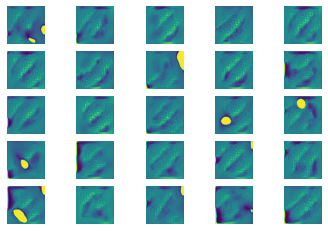

EPOCH: 58 BATCH: 1 d_loss1: 0.28372427821159363 d_loss2: 0.28919774293899536 g_loss: 0.2019808292388916
EPOCH: 58 BATCH: 2 d_loss1: 0.34625881910324097 d_loss2: 0.29588034749031067 g_loss: 0.23244434595108032
EPOCH: 58 BATCH: 3 d_loss1: 0.3520209789276123 d_loss2: 0.3608248829841614 g_loss: 0.33371248841285706
EPOCH: 58 BATCH: 4 d_loss1: 0.097898930311203 d_loss2: 0.11044420301914215 g_loss: 0.41721975803375244
EPOCH: 58 BATCH: 5 d_loss1: 0.337876558303833 d_loss2: 0.19937309622764587 g_loss: 0.4547695517539978
EPOCH: 58 BATCH: 6 d_loss1: 0.47190770506858826 d_loss2: 0.3548990488052368 g_loss: 0.33113083243370056
EPOCH: 58 BATCH: 7 d_loss1: 0.2924627959728241 d_loss2: 0.4155862331390381 g_loss: 0.6235617399215698
EPOCH: 58 BATCH: 8 d_loss1: 0.22159148752689362 d_loss2: 0.33055877685546875 g_loss: 0.7999471426010132
EPOCH: 58 BATCH: 9 d_loss1: 0.28131532669067383 d_loss2: 0.42202162742614746 g_loss: 1.4547317028045654
EPOCH: 58 BATCH: 10 d_loss1: 0.35073819756507874 d_loss2: 0.394549310

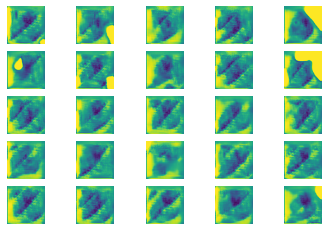

EPOCH: 59 BATCH: 1 d_loss1: 0.7935149669647217 d_loss2: 2.3472256660461426 g_loss: 2.205291748046875
EPOCH: 59 BATCH: 2 d_loss1: 1.719692587852478 d_loss2: 0.1885034739971161 g_loss: 2.0539002418518066
EPOCH: 59 BATCH: 3 d_loss1: 0.7118422985076904 d_loss2: 0.24198824167251587 g_loss: 1.7496721744537354
EPOCH: 59 BATCH: 4 d_loss1: 0.6315064430236816 d_loss2: 0.18167537450790405 g_loss: 1.8628283739089966
EPOCH: 59 BATCH: 5 d_loss1: 0.4511130452156067 d_loss2: 0.183299720287323 g_loss: 1.8741779327392578
EPOCH: 59 BATCH: 6 d_loss1: 0.2924790680408478 d_loss2: 0.16389137506484985 g_loss: 1.9297304153442383
EPOCH: 59 BATCH: 7 d_loss1: 0.2150799185037613 d_loss2: 0.17572283744812012 g_loss: 1.999323844909668
EPOCH: 59 BATCH: 8 d_loss1: 0.3130640983581543 d_loss2: 0.17867258191108704 g_loss: 1.6685047149658203
EPOCH: 59 BATCH: 9 d_loss1: 0.35215476155281067 d_loss2: 0.33940213918685913 g_loss: 1.9297196865081787
EPOCH: 59 BATCH: 10 d_loss1: 0.38492265343666077 d_loss2: 0.24739447236061096 g

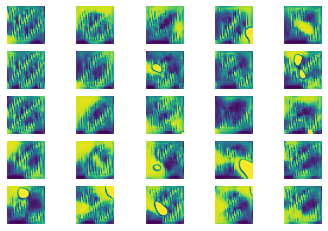

EPOCH: 60 BATCH: 1 d_loss1: 0.5454582571983337 d_loss2: 0.18117105960845947 g_loss: 2.2940874099731445
EPOCH: 60 BATCH: 2 d_loss1: 0.3344622850418091 d_loss2: 0.2249898612499237 g_loss: 2.060124158859253
EPOCH: 60 BATCH: 3 d_loss1: 0.24032266438007355 d_loss2: 0.30748698115348816 g_loss: 1.8692939281463623
EPOCH: 60 BATCH: 4 d_loss1: 0.30955415964126587 d_loss2: 0.20727525651454926 g_loss: 1.6544668674468994
EPOCH: 60 BATCH: 5 d_loss1: 0.42954105138778687 d_loss2: 0.32336047291755676 g_loss: 2.216156005859375
EPOCH: 60 BATCH: 6 d_loss1: 0.3279382586479187 d_loss2: 0.3439076840877533 g_loss: 2.9847798347473145
EPOCH: 60 BATCH: 7 d_loss1: 0.7208699584007263 d_loss2: 0.16292335093021393 g_loss: 1.2884336709976196
EPOCH: 60 BATCH: 8 d_loss1: 0.34977084398269653 d_loss2: 0.3760085701942444 g_loss: 0.8030301332473755
EPOCH: 60 BATCH: 9 d_loss1: 1.0185885429382324 d_loss2: 0.3689688444137573 g_loss: 0.16352973878383636
EPOCH: 60 BATCH: 10 d_loss1: 0.4491339325904846 d_loss2: 0.237813293933868

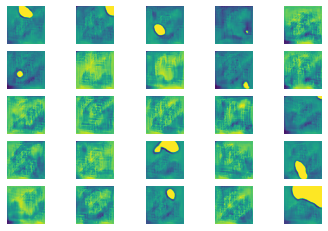

EPOCH: 61 BATCH: 1 d_loss1: 0.5348257422447205 d_loss2: 0.2340993881225586 g_loss: 1.667351245880127
EPOCH: 61 BATCH: 2 d_loss1: 0.2148796021938324 d_loss2: 0.26783570647239685 g_loss: 1.6326959133148193
EPOCH: 61 BATCH: 3 d_loss1: 0.40016433596611023 d_loss2: 0.261554479598999 g_loss: 1.7013425827026367
EPOCH: 61 BATCH: 4 d_loss1: 0.34949928522109985 d_loss2: 0.2682516872882843 g_loss: 1.3555548191070557
EPOCH: 61 BATCH: 5 d_loss1: 0.20117761194705963 d_loss2: 0.2573466897010803 g_loss: 1.6743203401565552
EPOCH: 61 BATCH: 6 d_loss1: 0.49240952730178833 d_loss2: 0.32722339034080505 g_loss: 0.9488948583602905
EPOCH: 61 BATCH: 7 d_loss1: 0.2945574223995209 d_loss2: 0.28163737058639526 g_loss: 0.6243659257888794
EPOCH: 61 BATCH: 8 d_loss1: 0.4056127667427063 d_loss2: 0.21458923816680908 g_loss: 0.3998616337776184
EPOCH: 61 BATCH: 9 d_loss1: 0.2669297456741333 d_loss2: 0.37328338623046875 g_loss: 0.06951352208852768
EPOCH: 61 BATCH: 10 d_loss1: 0.6461026668548584 d_loss2: 0.458729207515716

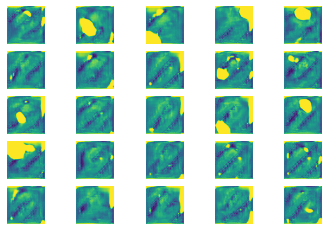

EPOCH: 62 BATCH: 1 d_loss1: 0.24741098284721375 d_loss2: 0.3039439618587494 g_loss: 1.3012861013412476
EPOCH: 62 BATCH: 2 d_loss1: 0.525670051574707 d_loss2: 0.26693934202194214 g_loss: 1.4029792547225952
EPOCH: 62 BATCH: 3 d_loss1: 0.3320656418800354 d_loss2: 0.35233211517333984 g_loss: 0.9066191911697388
EPOCH: 62 BATCH: 4 d_loss1: 0.37513595819473267 d_loss2: 0.2600080370903015 g_loss: 1.0970580577850342
EPOCH: 62 BATCH: 5 d_loss1: 0.6971318125724792 d_loss2: 0.33555173873901367 g_loss: 1.2157844305038452
EPOCH: 62 BATCH: 6 d_loss1: 0.2966408133506775 d_loss2: 0.4621560573577881 g_loss: 1.6473894119262695
EPOCH: 62 BATCH: 7 d_loss1: 0.33342304825782776 d_loss2: 0.19081881642341614 g_loss: 2.0869522094726562
EPOCH: 62 BATCH: 8 d_loss1: 0.36384522914886475 d_loss2: 0.15157078206539154 g_loss: 2.4353437423706055
EPOCH: 62 BATCH: 9 d_loss1: 0.32753169536590576 d_loss2: 0.12843254208564758 g_loss: 2.4037814140319824
EPOCH: 62 BATCH: 10 d_loss1: 0.27781620621681213 d_loss2: 0.155618131160

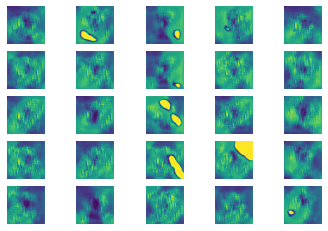

EPOCH: 63 BATCH: 1 d_loss1: 0.5044827461242676 d_loss2: 0.41393041610717773 g_loss: 0.6680502891540527
EPOCH: 63 BATCH: 2 d_loss1: 0.5680500268936157 d_loss2: 0.5722118616104126 g_loss: 1.041465163230896
EPOCH: 63 BATCH: 3 d_loss1: 0.30941176414489746 d_loss2: 0.45450741052627563 g_loss: 2.345888137817383
EPOCH: 63 BATCH: 4 d_loss1: 0.734750509262085 d_loss2: 0.42584744095802307 g_loss: 1.7388265132904053
EPOCH: 63 BATCH: 5 d_loss1: 0.5103651285171509 d_loss2: 0.30158117413520813 g_loss: 3.077115297317505
EPOCH: 63 BATCH: 6 d_loss1: 0.3304676413536072 d_loss2: 0.17030705511569977 g_loss: 2.1793272495269775
EPOCH: 63 BATCH: 7 d_loss1: 0.4059506952762604 d_loss2: 0.3546982407569885 g_loss: 1.7314337491989136
EPOCH: 63 BATCH: 8 d_loss1: 0.702883780002594 d_loss2: 0.5035691857337952 g_loss: 1.7992258071899414
EPOCH: 63 BATCH: 9 d_loss1: 0.5630438327789307 d_loss2: 0.26347973942756653 g_loss: 2.3723323345184326
EPOCH: 63 BATCH: 10 d_loss1: 0.3498908579349518 d_loss2: 0.1856565773487091 g_lo

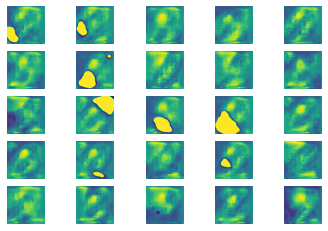

EPOCH: 64 BATCH: 1 d_loss1: 0.35291796922683716 d_loss2: 0.589849054813385 g_loss: 1.072170615196228
EPOCH: 64 BATCH: 2 d_loss1: 0.1581132709980011 d_loss2: 0.3700527846813202 g_loss: 1.5172618627548218
EPOCH: 64 BATCH: 3 d_loss1: 0.6651390790939331 d_loss2: 0.3687887191772461 g_loss: 1.9989169836044312
EPOCH: 64 BATCH: 4 d_loss1: 0.5329685211181641 d_loss2: 0.2024448662996292 g_loss: 0.9090156555175781
EPOCH: 64 BATCH: 5 d_loss1: 0.29319846630096436 d_loss2: 0.25277790427207947 g_loss: 1.1194591522216797
EPOCH: 64 BATCH: 6 d_loss1: 0.35472753643989563 d_loss2: 0.17536106705665588 g_loss: 1.2494078874588013
EPOCH: 64 BATCH: 7 d_loss1: 0.3573341369628906 d_loss2: 0.26600182056427 g_loss: 1.6851881742477417
EPOCH: 64 BATCH: 8 d_loss1: 0.550355076789856 d_loss2: 0.12514138221740723 g_loss: 1.847226858139038
EPOCH: 64 BATCH: 9 d_loss1: 0.2907043993473053 d_loss2: 0.13349388539791107 g_loss: 0.6052426099777222
EPOCH: 64 BATCH: 10 d_loss1: 0.3260601758956909 d_loss2: 0.3648023009300232 g_los

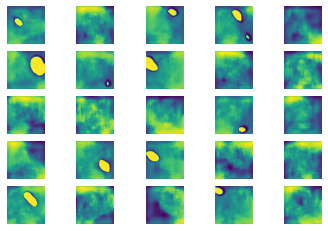

EPOCH: 65 BATCH: 1 d_loss1: 0.4228447675704956 d_loss2: 0.18344391882419586 g_loss: 2.0681867599487305
EPOCH: 65 BATCH: 2 d_loss1: 0.29370370507240295 d_loss2: 0.28908824920654297 g_loss: 2.400758981704712
EPOCH: 65 BATCH: 3 d_loss1: 0.19215843081474304 d_loss2: 0.11477498710155487 g_loss: 2.520219326019287
EPOCH: 65 BATCH: 4 d_loss1: 0.2166631817817688 d_loss2: 0.13533928990364075 g_loss: 2.427004814147949
EPOCH: 65 BATCH: 5 d_loss1: 0.20119188725948334 d_loss2: 0.1492207944393158 g_loss: 2.9460556507110596
EPOCH: 65 BATCH: 6 d_loss1: 0.3593001067638397 d_loss2: 0.29715263843536377 g_loss: 2.422112464904785
EPOCH: 65 BATCH: 7 d_loss1: 0.19623756408691406 d_loss2: 0.17773401737213135 g_loss: 2.637526035308838
EPOCH: 65 BATCH: 8 d_loss1: 0.22980257868766785 d_loss2: 0.13812611997127533 g_loss: 2.8906571865081787
EPOCH: 65 BATCH: 9 d_loss1: 0.15686586499214172 d_loss2: 0.15272393822669983 g_loss: 2.796067714691162
EPOCH: 65 BATCH: 10 d_loss1: 0.3225538432598114 d_loss2: 0.180995494127273

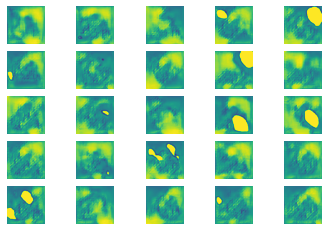

EPOCH: 66 BATCH: 1 d_loss1: 0.08406507223844528 d_loss2: 0.2213013619184494 g_loss: 0.24825550615787506
EPOCH: 66 BATCH: 2 d_loss1: 0.46726566553115845 d_loss2: 0.12285289168357849 g_loss: 0.14598378539085388
EPOCH: 66 BATCH: 3 d_loss1: 0.16458365321159363 d_loss2: 0.20609329640865326 g_loss: 0.05437071621417999
EPOCH: 66 BATCH: 4 d_loss1: 0.3671022653579712 d_loss2: 0.25554654002189636 g_loss: 0.06322568655014038
EPOCH: 66 BATCH: 5 d_loss1: 0.1784239411354065 d_loss2: 0.20936059951782227 g_loss: 0.4221441149711609
EPOCH: 66 BATCH: 6 d_loss1: 0.6399093866348267 d_loss2: 0.6586177349090576 g_loss: 1.3456907272338867
EPOCH: 66 BATCH: 7 d_loss1: 1.003562092781067 d_loss2: 0.7429409027099609 g_loss: 2.8232269287109375
EPOCH: 66 BATCH: 8 d_loss1: 1.244363784790039 d_loss2: 0.3588919937610626 g_loss: 2.772230386734009
EPOCH: 66 BATCH: 9 d_loss1: 0.6378753185272217 d_loss2: 0.8887984156608582 g_loss: 2.9180779457092285
EPOCH: 66 BATCH: 10 d_loss1: 0.9256272912025452 d_loss2: 0.175361514091491

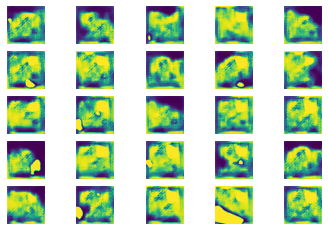

EPOCH: 67 BATCH: 1 d_loss1: 0.44234728813171387 d_loss2: 0.38190120458602905 g_loss: 2.808177947998047
EPOCH: 67 BATCH: 2 d_loss1: 1.0436913967132568 d_loss2: 0.40790292620658875 g_loss: 2.0510246753692627
EPOCH: 67 BATCH: 3 d_loss1: 0.47500908374786377 d_loss2: 0.5158349275588989 g_loss: 1.625805139541626
EPOCH: 67 BATCH: 4 d_loss1: 0.42502954602241516 d_loss2: 0.570171594619751 g_loss: 1.0708365440368652
EPOCH: 67 BATCH: 5 d_loss1: 0.9998196363449097 d_loss2: 0.46027064323425293 g_loss: 0.8977823257446289
EPOCH: 67 BATCH: 6 d_loss1: 0.6134090423583984 d_loss2: 0.22702118754386902 g_loss: 0.7190433144569397
EPOCH: 67 BATCH: 7 d_loss1: 0.7269766926765442 d_loss2: 0.549580454826355 g_loss: 0.7183372378349304
EPOCH: 67 BATCH: 8 d_loss1: 0.5726610422134399 d_loss2: 0.5297974944114685 g_loss: 0.8474204540252686
EPOCH: 67 BATCH: 9 d_loss1: 0.3846967816352844 d_loss2: 0.334284245967865 g_loss: 1.0871496200561523
EPOCH: 67 BATCH: 10 d_loss1: 0.25192445516586304 d_loss2: 0.24668851494789124 g_

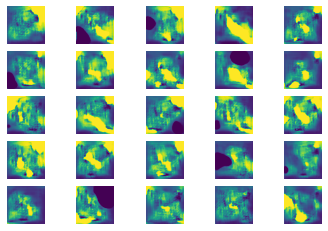

EPOCH: 68 BATCH: 1 d_loss1: 0.4526592791080475 d_loss2: 0.45937874913215637 g_loss: 1.8183003664016724
EPOCH: 68 BATCH: 2 d_loss1: 0.39874058961868286 d_loss2: 0.40896865725517273 g_loss: 1.5547219514846802
EPOCH: 68 BATCH: 3 d_loss1: 0.4001689553260803 d_loss2: 0.42923325300216675 g_loss: 1.5428123474121094
EPOCH: 68 BATCH: 4 d_loss1: 0.7188172936439514 d_loss2: 0.7139275670051575 g_loss: 1.5155785083770752
EPOCH: 68 BATCH: 5 d_loss1: 0.5135814547538757 d_loss2: 0.4508312940597534 g_loss: 1.6334457397460938
EPOCH: 68 BATCH: 6 d_loss1: 0.42400991916656494 d_loss2: 0.2908497452735901 g_loss: 1.6465383768081665
EPOCH: 68 BATCH: 7 d_loss1: 0.5147498250007629 d_loss2: 0.3728201687335968 g_loss: 1.7630245685577393
EPOCH: 68 BATCH: 8 d_loss1: 0.20028649270534515 d_loss2: 0.2697952389717102 g_loss: 1.9250470399856567
EPOCH: 68 BATCH: 9 d_loss1: 0.14819903671741486 d_loss2: 0.21186375617980957 g_loss: 2.0832483768463135
EPOCH: 68 BATCH: 10 d_loss1: 0.25638648867607117 d_loss2: 0.18221491575241

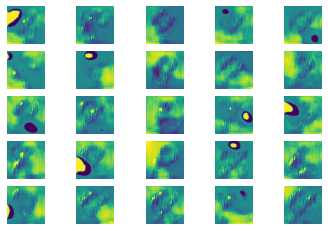

EPOCH: 69 BATCH: 1 d_loss1: 0.5502744913101196 d_loss2: 0.29472553730010986 g_loss: 1.8171170949935913
EPOCH: 69 BATCH: 2 d_loss1: 0.7261459231376648 d_loss2: 0.3675530254840851 g_loss: 1.8783683776855469
EPOCH: 69 BATCH: 3 d_loss1: 0.6097046732902527 d_loss2: 0.46175840497016907 g_loss: 2.0921292304992676
EPOCH: 69 BATCH: 4 d_loss1: 0.6548735499382019 d_loss2: 0.2405882179737091 g_loss: 2.013435125350952
EPOCH: 69 BATCH: 5 d_loss1: 0.4847515821456909 d_loss2: 0.18982543051242828 g_loss: 2.3297581672668457
EPOCH: 69 BATCH: 6 d_loss1: 0.4542244076728821 d_loss2: 0.2117536962032318 g_loss: 1.9613409042358398
EPOCH: 69 BATCH: 7 d_loss1: 0.5393072366714478 d_loss2: 0.3178173303604126 g_loss: 1.8863208293914795
EPOCH: 69 BATCH: 8 d_loss1: 0.17466573417186737 d_loss2: 0.1962612271308899 g_loss: 2.2691287994384766
EPOCH: 69 BATCH: 9 d_loss1: 0.7500808238983154 d_loss2: 0.2051306515932083 g_loss: 1.1050431728363037
EPOCH: 69 BATCH: 10 d_loss1: 0.25608229637145996 d_loss2: 0.23831205070018768 g

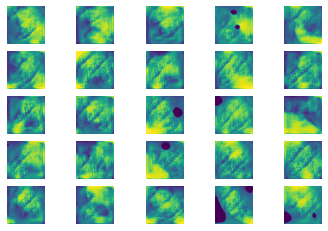

EPOCH: 70 BATCH: 1 d_loss1: 0.5590916275978088 d_loss2: 0.33001357316970825 g_loss: 1.944995403289795
EPOCH: 70 BATCH: 2 d_loss1: 0.38059359788894653 d_loss2: 0.17249909043312073 g_loss: 2.027160167694092
EPOCH: 70 BATCH: 3 d_loss1: 0.5308457612991333 d_loss2: 0.2461596429347992 g_loss: 1.9310328960418701
EPOCH: 70 BATCH: 4 d_loss1: 0.49084872007369995 d_loss2: 0.32127970457077026 g_loss: 1.819458246231079
EPOCH: 70 BATCH: 5 d_loss1: 0.3159862458705902 d_loss2: 0.2572278380393982 g_loss: 2.0151944160461426
EPOCH: 70 BATCH: 6 d_loss1: 0.34804531931877136 d_loss2: 0.2848486602306366 g_loss: 1.9685261249542236
EPOCH: 70 BATCH: 7 d_loss1: 0.352907657623291 d_loss2: 0.2425726056098938 g_loss: 1.7012258768081665
EPOCH: 70 BATCH: 8 d_loss1: 0.6378970146179199 d_loss2: 0.5452213287353516 g_loss: 1.6044163703918457
EPOCH: 70 BATCH: 9 d_loss1: 0.5718811750411987 d_loss2: 0.4936114549636841 g_loss: 1.1673575639724731
EPOCH: 70 BATCH: 10 d_loss1: 0.23863622546195984 d_loss2: 0.3683459162712097 g_l

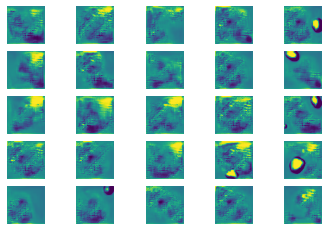

EPOCH: 71 BATCH: 1 d_loss1: 0.48718738555908203 d_loss2: 0.7911932468414307 g_loss: 1.222065806388855
EPOCH: 71 BATCH: 2 d_loss1: 0.7459992170333862 d_loss2: 0.6683604717254639 g_loss: 1.4980895519256592
EPOCH: 71 BATCH: 3 d_loss1: 0.2979236841201782 d_loss2: 0.2522408962249756 g_loss: 0.9578284025192261
EPOCH: 71 BATCH: 4 d_loss1: 0.41589486598968506 d_loss2: 0.4583117663860321 g_loss: 0.7910633087158203
EPOCH: 71 BATCH: 5 d_loss1: 0.31697386503219604 d_loss2: 0.33545470237731934 g_loss: 1.1164591312408447
EPOCH: 71 BATCH: 6 d_loss1: 0.39481058716773987 d_loss2: 0.2029244303703308 g_loss: 1.8047444820404053
EPOCH: 71 BATCH: 7 d_loss1: 0.5093019604682922 d_loss2: 0.2845543920993805 g_loss: 2.0773210525512695
EPOCH: 71 BATCH: 8 d_loss1: 0.33890390396118164 d_loss2: 0.18414045870304108 g_loss: 2.829986572265625
EPOCH: 71 BATCH: 9 d_loss1: 0.30837613344192505 d_loss2: 0.14622017741203308 g_loss: 2.1886539459228516
EPOCH: 71 BATCH: 10 d_loss1: 0.37575405836105347 d_loss2: 0.515561580657959

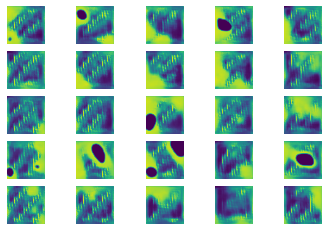

EPOCH: 72 BATCH: 1 d_loss1: 0.6585386991500854 d_loss2: 0.6904333829879761 g_loss: 1.4168510437011719
EPOCH: 72 BATCH: 2 d_loss1: 0.6517407894134521 d_loss2: 0.27726078033447266 g_loss: 1.5740545988082886
EPOCH: 72 BATCH: 3 d_loss1: 0.768532395362854 d_loss2: 0.4396634101867676 g_loss: 1.1715766191482544
EPOCH: 72 BATCH: 4 d_loss1: 0.5407719612121582 d_loss2: 0.5478577017784119 g_loss: 1.0603303909301758
EPOCH: 72 BATCH: 5 d_loss1: 0.7529230117797852 d_loss2: 0.4544089436531067 g_loss: 0.5780720710754395
EPOCH: 72 BATCH: 6 d_loss1: 1.017314076423645 d_loss2: 0.5150005221366882 g_loss: 1.410141110420227
EPOCH: 72 BATCH: 7 d_loss1: 0.7486259937286377 d_loss2: 0.1611471027135849 g_loss: 2.2377820014953613
EPOCH: 72 BATCH: 8 d_loss1: 0.5946277976036072 d_loss2: 0.14088916778564453 g_loss: 4.204522609710693
EPOCH: 72 BATCH: 9 d_loss1: 0.3374544382095337 d_loss2: 0.04110359400510788 g_loss: 4.9629716873168945
EPOCH: 72 BATCH: 10 d_loss1: 0.3389148712158203 d_loss2: 0.07564909011125565 g_loss

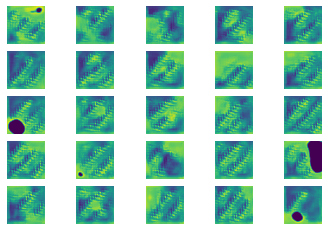

EPOCH: 73 BATCH: 1 d_loss1: 0.39172154664993286 d_loss2: 0.43301451206207275 g_loss: 1.3159873485565186
EPOCH: 73 BATCH: 2 d_loss1: 0.40121757984161377 d_loss2: 0.394757479429245 g_loss: 2.054431438446045
EPOCH: 73 BATCH: 3 d_loss1: 0.6452875137329102 d_loss2: 0.3767249286174774 g_loss: 1.826767921447754
EPOCH: 73 BATCH: 4 d_loss1: 0.4682355523109436 d_loss2: 0.33024805784225464 g_loss: 2.07179594039917
EPOCH: 73 BATCH: 5 d_loss1: 0.3083290159702301 d_loss2: 0.20229217410087585 g_loss: 1.4452857971191406
EPOCH: 73 BATCH: 6 d_loss1: 0.22140881419181824 d_loss2: 0.2695964574813843 g_loss: 0.8357622027397156
EPOCH: 73 BATCH: 7 d_loss1: 0.4520694613456726 d_loss2: 0.33531737327575684 g_loss: 0.7214497923851013
EPOCH: 73 BATCH: 8 d_loss1: 0.2906869053840637 d_loss2: 0.4025188684463501 g_loss: 0.47404101490974426
EPOCH: 73 BATCH: 9 d_loss1: 0.40327826142311096 d_loss2: 0.1967194378376007 g_loss: 0.5219390392303467
EPOCH: 73 BATCH: 10 d_loss1: 0.4374141991138458 d_loss2: 0.32596129179000854 g

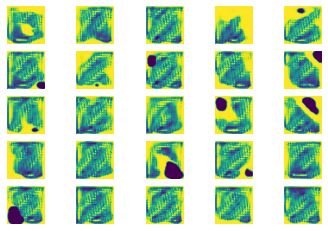

EPOCH: 74 BATCH: 1 d_loss1: 0.18160027265548706 d_loss2: 0.08433645963668823 g_loss: 2.120161294937134
EPOCH: 74 BATCH: 2 d_loss1: 0.27868881821632385 d_loss2: 0.2050519436597824 g_loss: 1.9575741291046143
EPOCH: 74 BATCH: 3 d_loss1: 0.30018937587738037 d_loss2: 0.14379161596298218 g_loss: 3.210853099822998
EPOCH: 74 BATCH: 4 d_loss1: 0.7577524185180664 d_loss2: 0.4274064600467682 g_loss: 7.499053955078125
EPOCH: 74 BATCH: 5 d_loss1: 0.42800796031951904 d_loss2: 0.1275748908519745 g_loss: 7.31725549697876
EPOCH: 74 BATCH: 6 d_loss1: 0.9714653491973877 d_loss2: 0.298044353723526 g_loss: 2.761302947998047
EPOCH: 74 BATCH: 7 d_loss1: 0.4302487373352051 d_loss2: 1.4899502992630005 g_loss: 8.747841835021973
EPOCH: 74 BATCH: 8 d_loss1: 2.9570891857147217 d_loss2: 0.04375526309013367 g_loss: 1.6063060760498047
EPOCH: 74 BATCH: 9 d_loss1: 2.0003554821014404 d_loss2: 1.0497891902923584 g_loss: 0.11146992444992065
EPOCH: 74 BATCH: 10 d_loss1: 0.725482165813446 d_loss2: 0.06735958158969879 g_loss

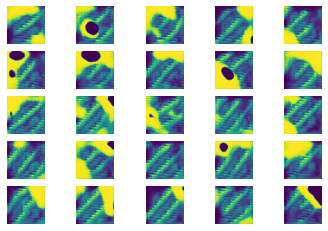

EPOCH: 75 BATCH: 1 d_loss1: 0.4726126492023468 d_loss2: 0.4675387144088745 g_loss: 1.8200592994689941
EPOCH: 75 BATCH: 2 d_loss1: 0.25670844316482544 d_loss2: 0.45001381635665894 g_loss: 2.276019334793091
EPOCH: 75 BATCH: 3 d_loss1: 0.43405666947364807 d_loss2: 0.4721337556838989 g_loss: 2.1008710861206055
EPOCH: 75 BATCH: 4 d_loss1: 0.6825207471847534 d_loss2: 0.529534101486206 g_loss: 1.7219226360321045
EPOCH: 75 BATCH: 5 d_loss1: 0.4311944246292114 d_loss2: 0.5062922835350037 g_loss: 1.448216438293457
EPOCH: 75 BATCH: 6 d_loss1: 0.6856042146682739 d_loss2: 0.4585619568824768 g_loss: 1.2570521831512451
EPOCH: 75 BATCH: 7 d_loss1: 0.6532814502716064 d_loss2: 0.5449117422103882 g_loss: 1.1717357635498047
EPOCH: 75 BATCH: 8 d_loss1: 0.5547624826431274 d_loss2: 0.5137057304382324 g_loss: 1.4920780658721924
EPOCH: 75 BATCH: 9 d_loss1: 0.6809975504875183 d_loss2: 0.3598152995109558 g_loss: 1.6264243125915527
EPOCH: 75 BATCH: 10 d_loss1: 0.6979467868804932 d_loss2: 0.47411590814590454 g_los

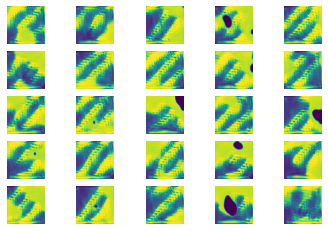

EPOCH: 76 BATCH: 1 d_loss1: 0.79151850938797 d_loss2: 0.3435542583465576 g_loss: 2.8301944732666016
EPOCH: 76 BATCH: 2 d_loss1: 0.5087901949882507 d_loss2: 0.5296199321746826 g_loss: 3.7260899543762207
EPOCH: 76 BATCH: 3 d_loss1: 1.3116419315338135 d_loss2: 0.8149817585945129 g_loss: 1.9577181339263916
EPOCH: 76 BATCH: 4 d_loss1: 0.5254900455474854 d_loss2: 0.34269753098487854 g_loss: 1.6306936740875244
EPOCH: 76 BATCH: 5 d_loss1: 0.8286806344985962 d_loss2: 0.3850632905960083 g_loss: 1.4706871509552002
EPOCH: 76 BATCH: 6 d_loss1: 0.6357228755950928 d_loss2: 0.49414825439453125 g_loss: 1.3022875785827637
EPOCH: 76 BATCH: 7 d_loss1: 0.4703161120414734 d_loss2: 0.4051738977432251 g_loss: 1.1277506351470947
EPOCH: 76 BATCH: 8 d_loss1: 0.7309592962265015 d_loss2: 0.9004481434822083 g_loss: 1.3069030046463013
EPOCH: 76 BATCH: 9 d_loss1: 0.6479237079620361 d_loss2: 0.7516967058181763 g_loss: 1.2379175424575806
EPOCH: 76 BATCH: 10 d_loss1: 0.966736912727356 d_loss2: 0.5742723941802979 g_loss:

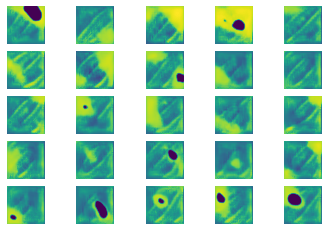

EPOCH: 77 BATCH: 1 d_loss1: 0.4514312744140625 d_loss2: 0.3808628022670746 g_loss: 0.6671880483627319
EPOCH: 77 BATCH: 2 d_loss1: 0.8694776296615601 d_loss2: 0.057902395725250244 g_loss: 0.5044376850128174
EPOCH: 77 BATCH: 3 d_loss1: 0.3166223168373108 d_loss2: 0.17128980159759521 g_loss: 0.18922574818134308
EPOCH: 77 BATCH: 4 d_loss1: 0.411027729511261 d_loss2: 0.2620769143104553 g_loss: 0.3130054771900177
EPOCH: 77 BATCH: 5 d_loss1: 0.3747289776802063 d_loss2: 0.07430475950241089 g_loss: 0.1759919375181198
EPOCH: 77 BATCH: 6 d_loss1: 0.2688191533088684 d_loss2: 0.265123188495636 g_loss: 0.3962114155292511
EPOCH: 77 BATCH: 7 d_loss1: 0.27824628353118896 d_loss2: 0.2282181978225708 g_loss: 0.4961225092411041
EPOCH: 77 BATCH: 8 d_loss1: 0.3893105387687683 d_loss2: 0.21980300545692444 g_loss: 0.4676114320755005
EPOCH: 77 BATCH: 9 d_loss1: 0.41491711139678955 d_loss2: 0.36753565073013306 g_loss: 0.6757481098175049
EPOCH: 77 BATCH: 10 d_loss1: 0.5366930961608887 d_loss2: 0.1405166238546371

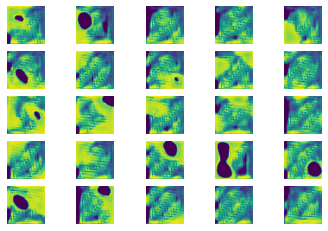

EPOCH: 78 BATCH: 1 d_loss1: 0.30324292182922363 d_loss2: 0.37676942348480225 g_loss: 1.730411410331726
EPOCH: 78 BATCH: 2 d_loss1: 0.256114661693573 d_loss2: 0.3627576231956482 g_loss: 1.151908040046692
EPOCH: 78 BATCH: 3 d_loss1: 0.9772722721099854 d_loss2: 1.3024154901504517 g_loss: 1.127124309539795
EPOCH: 78 BATCH: 4 d_loss1: 0.6923556327819824 d_loss2: 0.5490003824234009 g_loss: 2.0811219215393066
EPOCH: 78 BATCH: 5 d_loss1: 0.8440279960632324 d_loss2: 0.5344623327255249 g_loss: 3.2240095138549805
EPOCH: 78 BATCH: 6 d_loss1: 0.9840618968009949 d_loss2: 0.3914177417755127 g_loss: 2.532813310623169
EPOCH: 78 BATCH: 7 d_loss1: 0.9891102910041809 d_loss2: 0.7423174381256104 g_loss: 1.8025856018066406
EPOCH: 78 BATCH: 8 d_loss1: 0.8211556673049927 d_loss2: 0.18576112389564514 g_loss: 0.8490933179855347
EPOCH: 78 BATCH: 9 d_loss1: 0.7497032880783081 d_loss2: 0.30102676153182983 g_loss: 1.506672978401184
EPOCH: 78 BATCH: 10 d_loss1: 0.3929794728755951 d_loss2: 0.44658565521240234 g_loss:

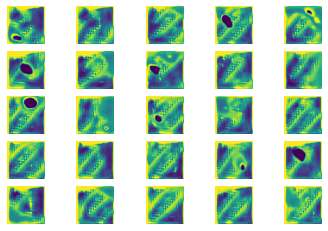

EPOCH: 79 BATCH: 1 d_loss1: 0.8877142071723938 d_loss2: 0.47247669100761414 g_loss: 4.27713680267334
EPOCH: 79 BATCH: 2 d_loss1: 0.7053607702255249 d_loss2: 0.011041159741580486 g_loss: 2.7897942066192627
EPOCH: 79 BATCH: 3 d_loss1: 0.3185631334781647 d_loss2: 0.1186969131231308 g_loss: 0.35732612013816833
EPOCH: 79 BATCH: 4 d_loss1: 0.3864719271659851 d_loss2: 0.7564826011657715 g_loss: 2.9123222827911377
EPOCH: 79 BATCH: 5 d_loss1: 0.9229192137718201 d_loss2: 0.01223667711019516 g_loss: 0.6249111890792847
EPOCH: 79 BATCH: 6 d_loss1: 0.5062084197998047 d_loss2: 0.6748490333557129 g_loss: 2.2460169792175293
EPOCH: 79 BATCH: 7 d_loss1: 0.8099722266197205 d_loss2: 0.016574257984757423 g_loss: 1.1249048709869385
EPOCH: 79 BATCH: 8 d_loss1: 0.9724513292312622 d_loss2: 1.2876203060150146 g_loss: 4.550601005554199
EPOCH: 79 BATCH: 9 d_loss1: 0.8032913208007812 d_loss2: 0.008200197480618954 g_loss: 1.721156358718872
EPOCH: 79 BATCH: 10 d_loss1: 0.628913164138794 d_loss2: 0.4846266806125641 g_

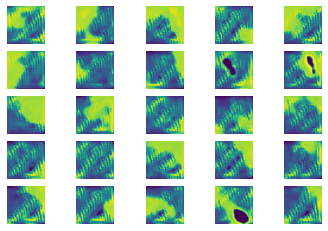

EPOCH: 80 BATCH: 1 d_loss1: 0.5340689420700073 d_loss2: 0.3917921781539917 g_loss: 1.0856966972351074
EPOCH: 80 BATCH: 2 d_loss1: 0.528846800327301 d_loss2: 0.5103968381881714 g_loss: 0.9086904525756836
EPOCH: 80 BATCH: 3 d_loss1: 0.5811101198196411 d_loss2: 0.43474283814430237 g_loss: 1.0179238319396973
EPOCH: 80 BATCH: 4 d_loss1: 0.48348909616470337 d_loss2: 0.35457873344421387 g_loss: 1.0441913604736328
EPOCH: 80 BATCH: 5 d_loss1: 0.6522891521453857 d_loss2: 0.8073861598968506 g_loss: 0.9896394610404968
EPOCH: 80 BATCH: 6 d_loss1: 0.39690613746643066 d_loss2: 0.38445645570755005 g_loss: 0.8966251611709595
EPOCH: 80 BATCH: 7 d_loss1: 0.9093189835548401 d_loss2: 0.7362537384033203 g_loss: 1.402003526687622
EPOCH: 80 BATCH: 8 d_loss1: 0.532776951789856 d_loss2: 0.5430424809455872 g_loss: 1.748896837234497
EPOCH: 80 BATCH: 9 d_loss1: 1.0356560945510864 d_loss2: 0.4833420217037201 g_loss: 1.267970323562622
EPOCH: 80 BATCH: 10 d_loss1: 0.5052951574325562 d_loss2: 0.5679415464401245 g_loss

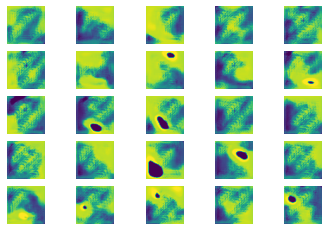

EPOCH: 81 BATCH: 1 d_loss1: 0.4872780740261078 d_loss2: 0.48573824763298035 g_loss: 0.6176500916481018
EPOCH: 81 BATCH: 2 d_loss1: 0.440601110458374 d_loss2: 0.2881804406642914 g_loss: 0.9185082912445068
EPOCH: 81 BATCH: 3 d_loss1: 0.5906423330307007 d_loss2: 1.0900228023529053 g_loss: 2.6371991634368896
EPOCH: 81 BATCH: 4 d_loss1: 0.4849470555782318 d_loss2: 0.46708256006240845 g_loss: 3.896817207336426
EPOCH: 81 BATCH: 5 d_loss1: 0.6265627145767212 d_loss2: 0.501043438911438 g_loss: 1.6875026226043701
EPOCH: 81 BATCH: 6 d_loss1: 0.8840739727020264 d_loss2: 0.23318517208099365 g_loss: 0.5763753652572632
EPOCH: 81 BATCH: 7 d_loss1: 0.682782769203186 d_loss2: 0.597518801689148 g_loss: 1.1881916522979736
EPOCH: 81 BATCH: 8 d_loss1: 0.7912474870681763 d_loss2: 0.4300796091556549 g_loss: 1.1728909015655518
EPOCH: 81 BATCH: 9 d_loss1: 0.5394884347915649 d_loss2: 0.33208441734313965 g_loss: 2.015488862991333
EPOCH: 81 BATCH: 10 d_loss1: 0.39222025871276855 d_loss2: 0.21225085854530334 g_loss

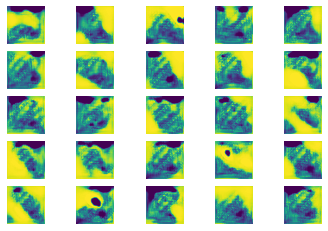

EPOCH: 82 BATCH: 1 d_loss1: 0.692604660987854 d_loss2: 0.04962550848722458 g_loss: 2.630993366241455
EPOCH: 82 BATCH: 2 d_loss1: 0.7132733464241028 d_loss2: 0.6233633160591125 g_loss: 3.170227527618408
EPOCH: 82 BATCH: 3 d_loss1: 0.5687858462333679 d_loss2: 0.13168860971927643 g_loss: 2.1963672637939453
EPOCH: 82 BATCH: 4 d_loss1: 0.09499169886112213 d_loss2: 0.6701301336288452 g_loss: 1.7843164205551147
EPOCH: 82 BATCH: 5 d_loss1: 0.6347871422767639 d_loss2: 0.523478627204895 g_loss: 1.105596661567688
EPOCH: 82 BATCH: 6 d_loss1: 0.4531135559082031 d_loss2: 0.37627795338630676 g_loss: 1.8355509042739868
EPOCH: 82 BATCH: 7 d_loss1: 0.38987627625465393 d_loss2: 0.10088736563920975 g_loss: 1.9630818367004395
EPOCH: 82 BATCH: 8 d_loss1: 0.30651772022247314 d_loss2: 0.5237584710121155 g_loss: 1.864126443862915
EPOCH: 82 BATCH: 9 d_loss1: 0.5673646926879883 d_loss2: 0.1481960117816925 g_loss: 1.4171346426010132
EPOCH: 82 BATCH: 10 d_loss1: 0.7499343752861023 d_loss2: 0.7055442929267883 g_los

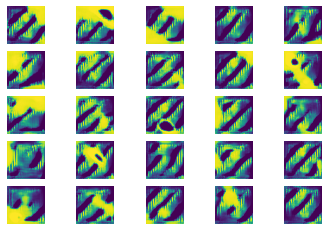

EPOCH: 83 BATCH: 1 d_loss1: 0.5047186613082886 d_loss2: 0.011057260446250439 g_loss: 4.476807594299316
EPOCH: 83 BATCH: 2 d_loss1: 0.912858247756958 d_loss2: 0.6629238724708557 g_loss: 2.7686219215393066
EPOCH: 83 BATCH: 3 d_loss1: 0.4967189431190491 d_loss2: 0.1645553559064865 g_loss: 3.093179702758789
EPOCH: 83 BATCH: 4 d_loss1: 0.4598061144351959 d_loss2: 0.3465725779533386 g_loss: 2.3798699378967285
EPOCH: 83 BATCH: 5 d_loss1: 0.9057259559631348 d_loss2: 0.9742463231086731 g_loss: 2.459293842315674
EPOCH: 83 BATCH: 6 d_loss1: 0.5812832713127136 d_loss2: 0.09792641550302505 g_loss: 2.0235540866851807
EPOCH: 83 BATCH: 7 d_loss1: 0.8970129489898682 d_loss2: 0.6119771599769592 g_loss: 3.222166061401367
EPOCH: 83 BATCH: 8 d_loss1: 0.6912651062011719 d_loss2: 0.07573597133159637 g_loss: 2.1020326614379883
EPOCH: 83 BATCH: 9 d_loss1: 0.9025331139564514 d_loss2: 1.2578887939453125 g_loss: 4.037288665771484
EPOCH: 83 BATCH: 10 d_loss1: 0.7162951231002808 d_loss2: 0.05442899093031883 g_loss:

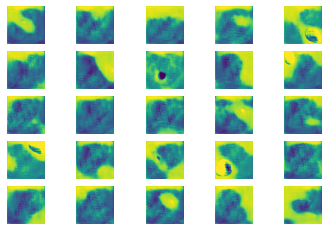

EPOCH: 84 BATCH: 1 d_loss1: 0.6125742197036743 d_loss2: 0.18842783570289612 g_loss: 1.825893759727478
EPOCH: 84 BATCH: 2 d_loss1: 0.368402361869812 d_loss2: 0.24776852130889893 g_loss: 2.080918550491333
EPOCH: 84 BATCH: 3 d_loss1: 0.17811810970306396 d_loss2: 0.10153695195913315 g_loss: 2.546771764755249
EPOCH: 84 BATCH: 4 d_loss1: 0.37552982568740845 d_loss2: 0.11762788891792297 g_loss: 1.7240630388259888
EPOCH: 84 BATCH: 5 d_loss1: 0.1841052770614624 d_loss2: 0.13462480902671814 g_loss: 1.7771027088165283
EPOCH: 84 BATCH: 6 d_loss1: 0.4342705011367798 d_loss2: 0.22684091329574585 g_loss: 1.29319167137146
EPOCH: 84 BATCH: 7 d_loss1: 0.3131113052368164 d_loss2: 0.23067599534988403 g_loss: 0.7888281345367432
EPOCH: 84 BATCH: 8 d_loss1: 0.30334824323654175 d_loss2: 0.19134488701820374 g_loss: 0.6924484372138977
EPOCH: 84 BATCH: 9 d_loss1: 0.2713031768798828 d_loss2: 0.21776622533798218 g_loss: 0.7071712613105774
EPOCH: 84 BATCH: 10 d_loss1: 0.21726906299591064 d_loss2: 0.1993104070425033

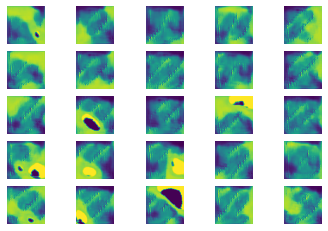

EPOCH: 85 BATCH: 1 d_loss1: 0.4069187641143799 d_loss2: 0.10523129999637604 g_loss: 0.02505635842680931
EPOCH: 85 BATCH: 2 d_loss1: 0.0888480395078659 d_loss2: 0.18749548494815826 g_loss: 0.15485906600952148
EPOCH: 85 BATCH: 3 d_loss1: 0.24714748561382294 d_loss2: 0.13370203971862793 g_loss: 0.24221885204315186
EPOCH: 85 BATCH: 4 d_loss1: 0.12837693095207214 d_loss2: 0.18368659913539886 g_loss: 0.258802205324173
EPOCH: 85 BATCH: 5 d_loss1: 0.19778233766555786 d_loss2: 0.13773289322853088 g_loss: 0.1539139449596405
EPOCH: 85 BATCH: 6 d_loss1: 0.20699062943458557 d_loss2: 0.17601153254508972 g_loss: 0.516118049621582
EPOCH: 85 BATCH: 7 d_loss1: 0.4184361398220062 d_loss2: 0.20016637444496155 g_loss: 0.7506043910980225
EPOCH: 85 BATCH: 8 d_loss1: 0.3074565529823303 d_loss2: 0.34344619512557983 g_loss: 2.9842910766601562
EPOCH: 85 BATCH: 9 d_loss1: 0.3438219726085663 d_loss2: 0.8768655061721802 g_loss: 7.205455780029297
EPOCH: 85 BATCH: 10 d_loss1: 1.206790804862976 d_loss2: 0.173840910196

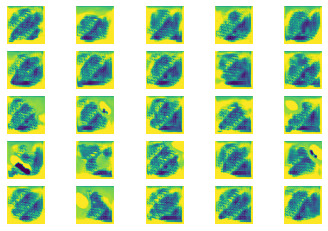

EPOCH: 86 BATCH: 1 d_loss1: 0.5357049703598022 d_loss2: 0.2508702278137207 g_loss: 1.773144006729126
EPOCH: 86 BATCH: 2 d_loss1: 0.7249979972839355 d_loss2: 0.17382249236106873 g_loss: 1.7806401252746582
EPOCH: 86 BATCH: 3 d_loss1: 0.8312261700630188 d_loss2: 0.42924660444259644 g_loss: 3.75106143951416
EPOCH: 86 BATCH: 4 d_loss1: 0.37380126118659973 d_loss2: 0.07949464023113251 g_loss: 1.671581506729126
EPOCH: 86 BATCH: 5 d_loss1: 0.46438392996788025 d_loss2: 0.3704419732093811 g_loss: 1.1376136541366577
EPOCH: 86 BATCH: 6 d_loss1: 0.19431276619434357 d_loss2: 0.32117778062820435 g_loss: 0.9806565046310425
EPOCH: 86 BATCH: 7 d_loss1: 0.39354971051216125 d_loss2: 0.39138364791870117 g_loss: 1.0951884984970093
EPOCH: 86 BATCH: 8 d_loss1: 0.281704843044281 d_loss2: 0.3834660053253174 g_loss: 0.30594900250434875
EPOCH: 86 BATCH: 9 d_loss1: 0.7881284952163696 d_loss2: 0.48846447467803955 g_loss: 1.3488562107086182
EPOCH: 86 BATCH: 10 d_loss1: 0.2803736925125122 d_loss2: 0.9700663089752197 

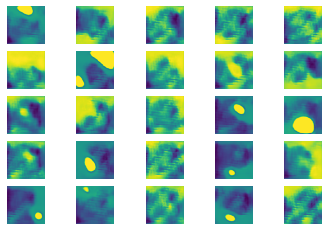

EPOCH: 87 BATCH: 1 d_loss1: 0.26201963424682617 d_loss2: 0.11355549097061157 g_loss: 0.9074099063873291
EPOCH: 87 BATCH: 2 d_loss1: 0.29110628366470337 d_loss2: 0.1935366541147232 g_loss: 1.7275502681732178
EPOCH: 87 BATCH: 3 d_loss1: 0.18169040977954865 d_loss2: 0.12993964552879333 g_loss: 1.5236358642578125
EPOCH: 87 BATCH: 4 d_loss1: 0.13045302033424377 d_loss2: 0.11790323257446289 g_loss: 1.4233431816101074
EPOCH: 87 BATCH: 5 d_loss1: 0.3738345801830292 d_loss2: 0.19074171781539917 g_loss: 2.5996475219726562
EPOCH: 87 BATCH: 6 d_loss1: 0.662058413028717 d_loss2: 0.1723220944404602 g_loss: 0.9814515113830566
EPOCH: 87 BATCH: 7 d_loss1: 0.29106605052948 d_loss2: 0.3498205244541168 g_loss: 1.1037507057189941
EPOCH: 87 BATCH: 8 d_loss1: 0.10510528087615967 d_loss2: 0.09729687869548798 g_loss: 0.8956873416900635
EPOCH: 87 BATCH: 9 d_loss1: 0.3036717474460602 d_loss2: 0.30255740880966187 g_loss: 0.8270142078399658
EPOCH: 87 BATCH: 10 d_loss1: 0.5365487337112427 d_loss2: 0.216523975133895

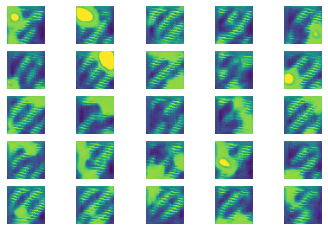

EPOCH: 88 BATCH: 1 d_loss1: 0.4445979595184326 d_loss2: 0.1858343780040741 g_loss: 0.2975793778896332
EPOCH: 88 BATCH: 2 d_loss1: 0.2613575756549835 d_loss2: 0.15106485784053802 g_loss: 0.28987425565719604
EPOCH: 88 BATCH: 3 d_loss1: 0.20346909761428833 d_loss2: 0.14461678266525269 g_loss: 0.23010596632957458
EPOCH: 88 BATCH: 4 d_loss1: 0.47165000438690186 d_loss2: 0.2550200819969177 g_loss: 0.14466899633407593
EPOCH: 88 BATCH: 5 d_loss1: 0.34289586544036865 d_loss2: 0.26216477155685425 g_loss: 0.2566155791282654
EPOCH: 88 BATCH: 6 d_loss1: 0.39190012216567993 d_loss2: 0.3591708540916443 g_loss: 0.5331674814224243
EPOCH: 88 BATCH: 7 d_loss1: 0.17587552964687347 d_loss2: 0.14382177591323853 g_loss: 0.5192387104034424
EPOCH: 88 BATCH: 8 d_loss1: 0.3360960781574249 d_loss2: 0.3943782448768616 g_loss: 0.6682673692703247
EPOCH: 88 BATCH: 9 d_loss1: 0.5243932008743286 d_loss2: 0.5612574815750122 g_loss: 0.556927502155304
EPOCH: 88 BATCH: 10 d_loss1: 1.1906101703643799 d_loss2: 0.992613852024

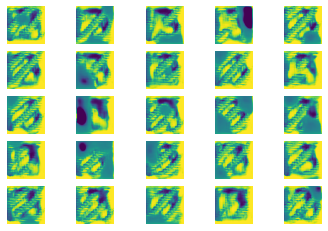

EPOCH: 89 BATCH: 1 d_loss1: 0.29225805401802063 d_loss2: 0.25757893919944763 g_loss: 0.6246123909950256
EPOCH: 89 BATCH: 2 d_loss1: 0.09944310784339905 d_loss2: 0.06408089399337769 g_loss: 0.4285252094268799
EPOCH: 89 BATCH: 3 d_loss1: 0.44988322257995605 d_loss2: 0.7142953872680664 g_loss: 0.8990045785903931
EPOCH: 89 BATCH: 4 d_loss1: 0.5672427415847778 d_loss2: 0.04386542737483978 g_loss: 3.2800278663635254
EPOCH: 89 BATCH: 5 d_loss1: 0.24324551224708557 d_loss2: 0.3085674047470093 g_loss: 0.8990604877471924
EPOCH: 89 BATCH: 6 d_loss1: 0.5231343507766724 d_loss2: 0.43552958965301514 g_loss: 1.394180417060852
EPOCH: 89 BATCH: 7 d_loss1: 0.36302319169044495 d_loss2: 0.1638277918100357 g_loss: 0.909694254398346
EPOCH: 89 BATCH: 8 d_loss1: 0.1699635237455368 d_loss2: 0.34389668703079224 g_loss: 1.3231780529022217
EPOCH: 89 BATCH: 9 d_loss1: 0.8601884841918945 d_loss2: 0.27968499064445496 g_loss: 2.933353900909424
EPOCH: 89 BATCH: 10 d_loss1: 0.17794913053512573 d_loss2: 0.47229197621345

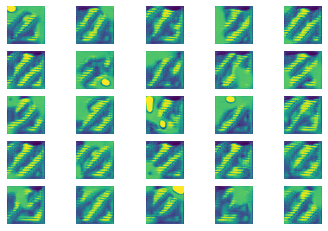

EPOCH: 90 BATCH: 1 d_loss1: 0.8131852149963379 d_loss2: 0.29123926162719727 g_loss: 2.725677967071533
EPOCH: 90 BATCH: 2 d_loss1: 0.31212353706359863 d_loss2: 0.27302443981170654 g_loss: 2.088444709777832
EPOCH: 90 BATCH: 3 d_loss1: 0.14415870606899261 d_loss2: 0.37601929903030396 g_loss: 2.4660298824310303
EPOCH: 90 BATCH: 4 d_loss1: 1.0431411266326904 d_loss2: 0.4806342124938965 g_loss: 1.962865948677063
EPOCH: 90 BATCH: 5 d_loss1: 0.5649932622909546 d_loss2: 0.264133483171463 g_loss: 1.6936802864074707
EPOCH: 90 BATCH: 6 d_loss1: 0.5996394157409668 d_loss2: 0.3465765714645386 g_loss: 1.3341511487960815
EPOCH: 90 BATCH: 7 d_loss1: 0.5220661163330078 d_loss2: 0.35969406366348267 g_loss: 1.514447569847107
EPOCH: 90 BATCH: 8 d_loss1: 0.6927781105041504 d_loss2: 0.6009446978569031 g_loss: 1.3861184120178223
EPOCH: 90 BATCH: 9 d_loss1: 0.8339651823043823 d_loss2: 0.3004629611968994 g_loss: 1.1502878665924072
EPOCH: 90 BATCH: 10 d_loss1: 0.5594930648803711 d_loss2: 0.6040543913841248 g_los

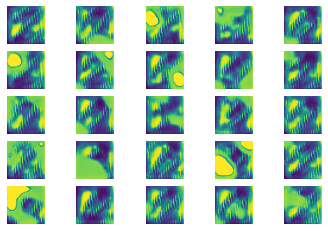

EPOCH: 91 BATCH: 1 d_loss1: 0.6071649193763733 d_loss2: 0.4455101191997528 g_loss: 2.007474899291992
EPOCH: 91 BATCH: 2 d_loss1: 0.23295801877975464 d_loss2: 0.046857669949531555 g_loss: 2.090195655822754
EPOCH: 91 BATCH: 3 d_loss1: 0.34219107031822205 d_loss2: 0.19512635469436646 g_loss: 1.1421047449111938
EPOCH: 91 BATCH: 4 d_loss1: 0.5688551664352417 d_loss2: 0.3293434977531433 g_loss: 2.623946189880371
EPOCH: 91 BATCH: 5 d_loss1: 0.4327988624572754 d_loss2: 0.1292877197265625 g_loss: 2.245316982269287
EPOCH: 91 BATCH: 6 d_loss1: 0.460324764251709 d_loss2: 0.4121952950954437 g_loss: 1.860205888748169
EPOCH: 91 BATCH: 7 d_loss1: 0.17757394909858704 d_loss2: 0.1367613673210144 g_loss: 1.2580630779266357
EPOCH: 91 BATCH: 8 d_loss1: 0.15684273838996887 d_loss2: 0.2511211633682251 g_loss: 0.780469536781311
EPOCH: 91 BATCH: 9 d_loss1: 0.4898984432220459 d_loss2: 0.9824387431144714 g_loss: 0.1839023232460022
EPOCH: 91 BATCH: 10 d_loss1: 0.20277075469493866 d_loss2: 0.1750929057598114 g_los

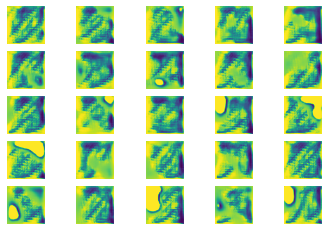

EPOCH: 92 BATCH: 1 d_loss1: 0.34859150648117065 d_loss2: 0.45051679015159607 g_loss: 1.8208402395248413
EPOCH: 92 BATCH: 2 d_loss1: 0.28833192586898804 d_loss2: 0.19390174746513367 g_loss: 1.568076491355896
EPOCH: 92 BATCH: 3 d_loss1: 0.23518159985542297 d_loss2: 0.4165925979614258 g_loss: 1.6855204105377197
EPOCH: 92 BATCH: 4 d_loss1: 0.6958574056625366 d_loss2: 0.26368361711502075 g_loss: 0.35276249051094055
EPOCH: 92 BATCH: 5 d_loss1: 0.25952377915382385 d_loss2: 0.24908645451068878 g_loss: 0.40423184633255005
EPOCH: 92 BATCH: 6 d_loss1: 0.1397387683391571 d_loss2: 0.715234100818634 g_loss: 0.42536938190460205
EPOCH: 92 BATCH: 7 d_loss1: 0.9208004474639893 d_loss2: 0.3068656921386719 g_loss: 0.026967864483594894
EPOCH: 92 BATCH: 8 d_loss1: 0.414908230304718 d_loss2: 0.42916634678840637 g_loss: 0.1635058969259262
EPOCH: 92 BATCH: 9 d_loss1: 0.4491187334060669 d_loss2: 0.2274523675441742 g_loss: 0.6989132165908813
EPOCH: 92 BATCH: 10 d_loss1: 0.21325987577438354 d_loss2: 0.26934701204

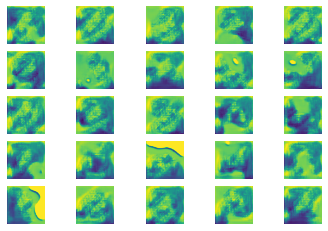

EPOCH: 93 BATCH: 1 d_loss1: 0.15567436814308167 d_loss2: 0.18424078822135925 g_loss: 1.5705952644348145
EPOCH: 93 BATCH: 2 d_loss1: 0.19408106803894043 d_loss2: 0.21380122005939484 g_loss: 1.5646142959594727
EPOCH: 93 BATCH: 3 d_loss1: 0.24075168371200562 d_loss2: 0.18565863370895386 g_loss: 1.4926942586898804
EPOCH: 93 BATCH: 4 d_loss1: 0.4759792387485504 d_loss2: 0.36735042929649353 g_loss: 1.4687974452972412
EPOCH: 93 BATCH: 5 d_loss1: 0.40332016348838806 d_loss2: 0.26915237307548523 g_loss: 1.1581337451934814
EPOCH: 93 BATCH: 6 d_loss1: 0.24477949738502502 d_loss2: 0.33418428897857666 g_loss: 0.929256021976471
EPOCH: 93 BATCH: 7 d_loss1: 0.4142206907272339 d_loss2: 0.3155673146247864 g_loss: 0.4348454773426056
EPOCH: 93 BATCH: 8 d_loss1: 0.3833257257938385 d_loss2: 0.341392457485199 g_loss: 0.5396240949630737
EPOCH: 93 BATCH: 9 d_loss1: 0.3445819020271301 d_loss2: 0.10021665692329407 g_loss: 0.42912933230400085
EPOCH: 93 BATCH: 10 d_loss1: 0.47066354751586914 d_loss2: 0.21667437255

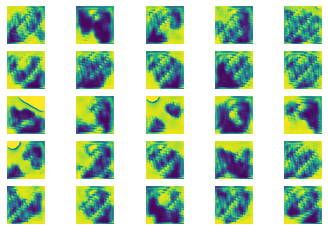

EPOCH: 94 BATCH: 1 d_loss1: 0.34029605984687805 d_loss2: 0.12033767998218536 g_loss: 0.21809940040111542
EPOCH: 94 BATCH: 2 d_loss1: 0.2847866714000702 d_loss2: 0.3802572786808014 g_loss: 1.4769634008407593
EPOCH: 94 BATCH: 3 d_loss1: 0.22598282992839813 d_loss2: 0.059382036328315735 g_loss: 2.510523796081543
EPOCH: 94 BATCH: 4 d_loss1: 0.16193222999572754 d_loss2: 0.374772846698761 g_loss: 2.9036850929260254
EPOCH: 94 BATCH: 5 d_loss1: 0.8829407095909119 d_loss2: 0.2811376750469208 g_loss: 3.8212764263153076
EPOCH: 94 BATCH: 6 d_loss1: 0.9397621750831604 d_loss2: 0.3936805725097656 g_loss: 4.06102991104126
EPOCH: 94 BATCH: 7 d_loss1: 1.2978501319885254 d_loss2: 0.5064470767974854 g_loss: 4.707441329956055
EPOCH: 94 BATCH: 8 d_loss1: 1.3777990341186523 d_loss2: 0.10074221342802048 g_loss: 2.169206142425537
EPOCH: 94 BATCH: 9 d_loss1: 0.5336484313011169 d_loss2: 0.8049455881118774 g_loss: 2.563455581665039
EPOCH: 94 BATCH: 10 d_loss1: 1.0517257452011108 d_loss2: 0.056556396186351776 g_l

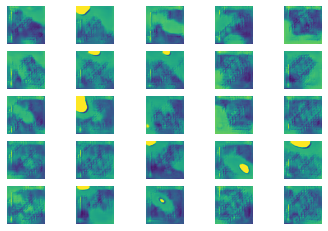

EPOCH: 95 BATCH: 1 d_loss1: 0.5383374691009521 d_loss2: 0.4210895895957947 g_loss: 0.4291750192642212
EPOCH: 95 BATCH: 2 d_loss1: 0.4020761549472809 d_loss2: 0.5565313100814819 g_loss: 0.36599016189575195
EPOCH: 95 BATCH: 3 d_loss1: 0.2900603413581848 d_loss2: 0.21957309544086456 g_loss: 0.5700450539588928
EPOCH: 95 BATCH: 4 d_loss1: 0.3939976096153259 d_loss2: 0.3953518867492676 g_loss: 0.41508913040161133
EPOCH: 95 BATCH: 5 d_loss1: 0.2388017475605011 d_loss2: 0.2058757245540619 g_loss: 0.29847031831741333
EPOCH: 95 BATCH: 6 d_loss1: 0.7447457313537598 d_loss2: 0.4377603530883789 g_loss: 0.4031078517436981
EPOCH: 95 BATCH: 7 d_loss1: 0.30473583936691284 d_loss2: 0.42849332094192505 g_loss: 0.5861095190048218
EPOCH: 95 BATCH: 8 d_loss1: 0.20912854373455048 d_loss2: 0.19838857650756836 g_loss: 1.177675724029541
EPOCH: 95 BATCH: 9 d_loss1: 0.1730939745903015 d_loss2: 0.3664086163043976 g_loss: 2.8000354766845703
EPOCH: 95 BATCH: 10 d_loss1: 0.5431514978408813 d_loss2: 0.2840726375579834

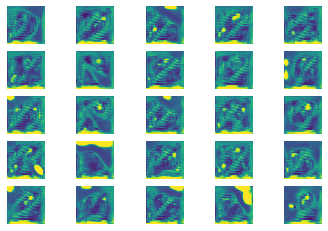

EPOCH: 96 BATCH: 1 d_loss1: 0.5024368166923523 d_loss2: 0.3087199926376343 g_loss: 0.8835281133651733
EPOCH: 96 BATCH: 2 d_loss1: 0.2822328805923462 d_loss2: 0.6219971179962158 g_loss: 0.807610034942627
EPOCH: 96 BATCH: 3 d_loss1: 0.7997786998748779 d_loss2: 0.8778847455978394 g_loss: 2.7434592247009277
EPOCH: 96 BATCH: 4 d_loss1: 1.1285099983215332 d_loss2: 0.8503184914588928 g_loss: 1.799272060394287
EPOCH: 96 BATCH: 5 d_loss1: 1.444549560546875 d_loss2: 0.9083257913589478 g_loss: 1.9144015312194824
EPOCH: 96 BATCH: 6 d_loss1: 1.8590152263641357 d_loss2: 0.48256123065948486 g_loss: 1.4076972007751465
EPOCH: 96 BATCH: 7 d_loss1: 0.6469672918319702 d_loss2: 0.357735812664032 g_loss: 2.5372610092163086
EPOCH: 96 BATCH: 8 d_loss1: 0.4191072881221771 d_loss2: 0.265649676322937 g_loss: 2.874903440475464
EPOCH: 96 BATCH: 9 d_loss1: 0.3296591639518738 d_loss2: 0.16485394537448883 g_loss: 2.9506731033325195
EPOCH: 96 BATCH: 10 d_loss1: 0.3572149872779846 d_loss2: 0.1636003851890564 g_loss: 0.

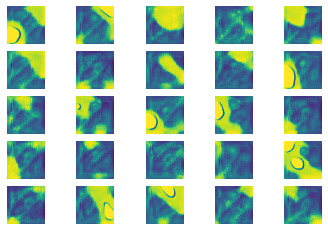

EPOCH: 97 BATCH: 1 d_loss1: 0.46188992261886597 d_loss2: 0.31468695402145386 g_loss: 2.4737300872802734
EPOCH: 97 BATCH: 2 d_loss1: 0.5476536750793457 d_loss2: 0.3223777413368225 g_loss: 1.964635968208313
EPOCH: 97 BATCH: 3 d_loss1: 0.14701266586780548 d_loss2: 0.18709996342658997 g_loss: 2.3923768997192383
EPOCH: 97 BATCH: 4 d_loss1: 0.24681054055690765 d_loss2: 0.1608167439699173 g_loss: 2.5087811946868896
EPOCH: 97 BATCH: 5 d_loss1: 0.2994333505630493 d_loss2: 0.23550324141979218 g_loss: 1.439068078994751
EPOCH: 97 BATCH: 6 d_loss1: 0.3506542146205902 d_loss2: 0.24877405166625977 g_loss: 0.8308415412902832
EPOCH: 97 BATCH: 7 d_loss1: 0.3993679881095886 d_loss2: 0.31245264410972595 g_loss: 0.6655783653259277
EPOCH: 97 BATCH: 8 d_loss1: 0.4328703284263611 d_loss2: 0.29090631008148193 g_loss: 0.9779631495475769
EPOCH: 97 BATCH: 9 d_loss1: 0.5575775504112244 d_loss2: 0.31485357880592346 g_loss: 0.7106068134307861
EPOCH: 97 BATCH: 10 d_loss1: 0.32171201705932617 d_loss2: 0.29606193304061

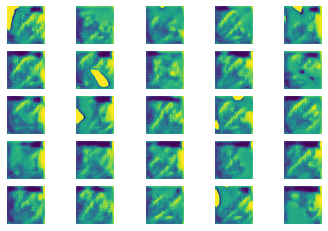

EPOCH: 98 BATCH: 1 d_loss1: 0.5250115394592285 d_loss2: 0.26320597529411316 g_loss: 2.133378267288208
EPOCH: 98 BATCH: 2 d_loss1: 0.5127865076065063 d_loss2: 0.4467839002609253 g_loss: 2.779736042022705
EPOCH: 98 BATCH: 3 d_loss1: 0.8266822099685669 d_loss2: 0.25941702723503113 g_loss: 1.5727965831756592
EPOCH: 98 BATCH: 4 d_loss1: 0.3990781307220459 d_loss2: 0.2838726043701172 g_loss: 2.3368310928344727
EPOCH: 98 BATCH: 5 d_loss1: 0.9499918222427368 d_loss2: 1.6816836595535278 g_loss: 7.0797600746154785
EPOCH: 98 BATCH: 6 d_loss1: 0.8331966996192932 d_loss2: 0.001630477956496179 g_loss: 4.500226974487305
EPOCH: 98 BATCH: 7 d_loss1: 0.7861350774765015 d_loss2: 0.05807288736104965 g_loss: 0.25401201844215393
EPOCH: 98 BATCH: 8 d_loss1: 0.253896564245224 d_loss2: 0.9590575695037842 g_loss: 0.7963554263114929
EPOCH: 98 BATCH: 9 d_loss1: 0.37702256441116333 d_loss2: 0.07348719984292984 g_loss: 0.7475279569625854
EPOCH: 98 BATCH: 10 d_loss1: 0.729316234588623 d_loss2: 0.6291014552116394 g_l

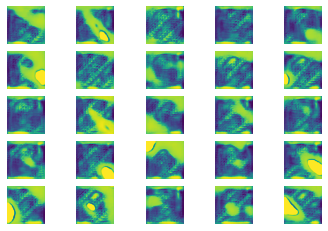

EPOCH: 99 BATCH: 1 d_loss1: 0.4258945882320404 d_loss2: 0.42662546038627625 g_loss: 2.4779248237609863
EPOCH: 99 BATCH: 2 d_loss1: 0.9157101511955261 d_loss2: 0.27376484870910645 g_loss: 2.1880059242248535
EPOCH: 99 BATCH: 3 d_loss1: 0.513259768486023 d_loss2: 0.28471851348876953 g_loss: 2.4525504112243652
EPOCH: 99 BATCH: 4 d_loss1: 0.33691561222076416 d_loss2: 0.20497803390026093 g_loss: 1.759825587272644
EPOCH: 99 BATCH: 5 d_loss1: 0.360311359167099 d_loss2: 0.42060762643814087 g_loss: 1.4370474815368652
EPOCH: 99 BATCH: 6 d_loss1: 0.26465320587158203 d_loss2: 0.31773972511291504 g_loss: 1.310082197189331
EPOCH: 99 BATCH: 7 d_loss1: 0.32296469807624817 d_loss2: 0.5625737309455872 g_loss: 1.403063178062439
EPOCH: 99 BATCH: 8 d_loss1: 0.8059086799621582 d_loss2: 0.2940809726715088 g_loss: 1.5153131484985352
EPOCH: 99 BATCH: 9 d_loss1: 0.5075740814208984 d_loss2: 0.3408661484718323 g_loss: 1.9974980354309082
EPOCH: 99 BATCH: 10 d_loss1: 0.3465021252632141 d_loss2: 0.1699647158384323 g_

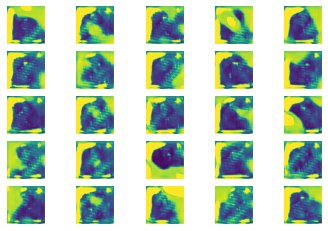

EPOCH: 100 BATCH: 1 d_loss1: 0.19584950804710388 d_loss2: 0.06585502624511719 g_loss: 3.6619749069213867
EPOCH: 100 BATCH: 2 d_loss1: 0.2535581886768341 d_loss2: 0.5388169288635254 g_loss: 2.5934345722198486
EPOCH: 100 BATCH: 3 d_loss1: 0.8629875183105469 d_loss2: 0.851285994052887 g_loss: 4.521259307861328
EPOCH: 100 BATCH: 4 d_loss1: 0.7115805149078369 d_loss2: 0.03545428439974785 g_loss: 1.6000139713287354
EPOCH: 100 BATCH: 5 d_loss1: 0.5340335369110107 d_loss2: 0.28015342354774475 g_loss: 0.4893548786640167
EPOCH: 100 BATCH: 6 d_loss1: 0.39940375089645386 d_loss2: 0.4422740638256073 g_loss: 1.2851366996765137
EPOCH: 100 BATCH: 7 d_loss1: 0.31447067856788635 d_loss2: 0.23483335971832275 g_loss: 1.0169669389724731
EPOCH: 100 BATCH: 8 d_loss1: 0.4452633261680603 d_loss2: 0.37817978858947754 g_loss: 1.4403250217437744
EPOCH: 100 BATCH: 9 d_loss1: 0.47476670145988464 d_loss2: 0.17784066498279572 g_loss: 1.338912010192871
EPOCH: 100 BATCH: 10 d_loss1: 0.4498443007469177 d_loss2: 0.268895

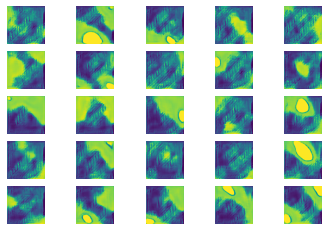

In [ ]:
d_loss1_history = []
d_loss2_history = []
g_loss_history = []

def train(g_model,d_model,gan_model,dataset,latent_dim,n_epochs=100,n_batch=64):
      bat_per_epo = int(dataset.shape[0]/n_batch)
      half_batch = int(n_batch/2)
      for i in range(n_epochs):
          for j in range(bat_per_epo):
              X_real, y_real = generate_real_samples(dataset,half_batch)
              d_loss1,_ = d_model.train_on_batch(X_real,y_real)
              X_fake, y_fake = generate_fake_samples(g_model,latent_dim,half_batch)
              d_loss2,_ = d_model.train_on_batch(X_fake,y_fake)
              X_gan = generate_latent_points(n_batch,latent_dim)
              y_gan = np.ones((n_batch,1))
              g_loss = gan_model.train_on_batch(X_gan,y_gan) 

              d_loss1_history.append(d_loss1)
              d_loss2_history.append(d_loss2)
              g_loss_history.append(g_loss)
              print("EPOCH:",i+1,"BATCH:",j+1,"d_loss1:",d_loss1,"d_loss2:",d_loss2,"g_loss:",g_loss)
          
          points = generate_latent_points(25)
          X = g_model.predict(points)
          show_plot(X,5)

      d_model.save('/content/gdrive/My Drive/ART DATASET/art_discriminator.h5')
      g_model.save('/content/gdrive/My Drive/ART DATASET/art_generator.h5')

gen = define_generator()
dis = define_discriminator()
gan = define_gan(dis,gen)
train(gen,dis,gan,dataset,NOISE_SIZE,100)

<B> PLOTTING TRAINING HISTORY <B>

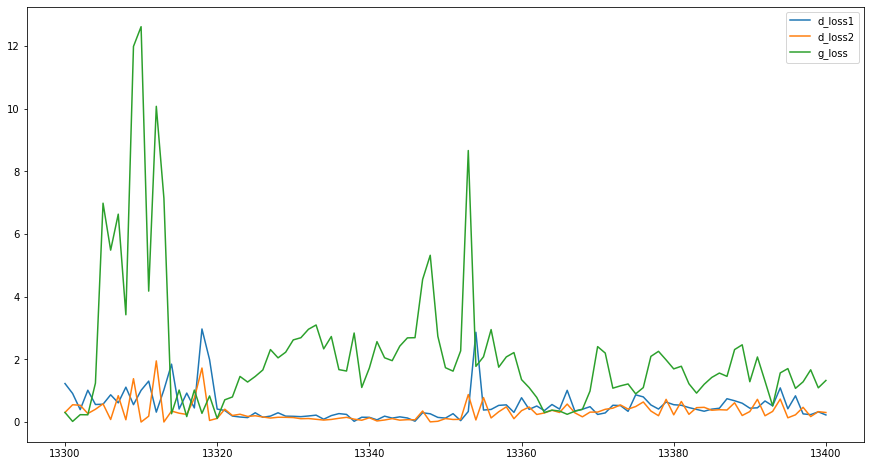

In [ ]:
plt.figure(figsize=(15,8))
plt.plot([i for i in range(len(d_loss1_history) - 100,len(d_loss1_history)+1)],d_loss1_history[-101:],label="d_loss1")
plt.plot([i for i in range(len(d_loss2_history)-100,len(d_loss2_history)+1)],d_loss2_history[-101:],label="d_loss2")
plt.plot([i for i in range(len(g_loss_history)-100,len(g_loss_history)+1)],g_loss_history[-101:],label="g_loss")
plt.legend()
plt.show()

In [ ]:
mean(d_loss2_history)

0.42508671818340504

<B> GENERATE PICTURES <B>

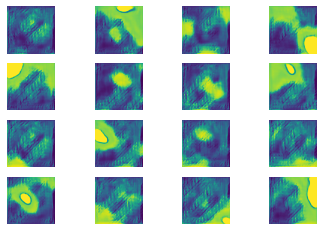

In [ ]:
model = load_model('/content/gdrive/My Drive/ART DATASET/art_generator.h5')
latent_points = generate_latent_points(16)
X = model.predict(latent_points)
show_plot(X,4)